In [1]:
#!pip install --upgrade pandas
#!pip install --upgrade pandas-datareader
#!pip install nbimporter


### Libraries

In [2]:
import pandas as pd#data structures and operations for manipulating numerical tables and time series.
import pandas_datareader.data as data#Up-to-date remote data access for pandas.
import datetime as dt#supplies classes for manipulating dates and times
from datetime import timedelta
import matplotlib.pyplot as plt#plotting library for the Python.
import seaborn as sns;# visualizacion
import warnings
warnings.filterwarnings('ignore') # We can suppress the warnings
import itertools
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf 
from statsmodels.tsa.stattools import adfuller
import statsmodels.tsa.api as smtsa
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from statsmodels.tools.eval_measures import rmse
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error,  mean_squared_log_error, median_absolute_error
from statsmodels.tsa.ar_model import AR,ARResults# Load specific forecasting tools
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima_model import ARMA,ARMAResults,ARIMA,ARIMAResults
from itertools import product
from math import sqrt
from fbprophet import Prophet
from fbprophet.plot import plot_plotly, plot_components_plotly
from fbprophet.diagnostics import performance_metrics
from fbprophet.diagnostics import cross_validation
from fbprophet.plot import plot_cross_validation_metric
import plotly.express as px
import plotly.graph_objects as go
import nbimporter
import Plots as Plo

In [3]:
#!pip install pandas-datareader
#!pip install seaborn
#!conda install -c plotly plotly
#!pip install pmdarima
#!conda install -c conda-forge fbprophet -y
#!pip install fbprophet
#!pip install pystan==2.17.1.0
#!pip install nbimporter

### Contents

### I.- Describe Data :

This is research about 2 companies of renewable energy in the stock market. The problematic here is a forecasting, that consists of predicting the values in the future of these companies, we are working with time series.


#### A.- EDP Renováveis (0ML1.IL)

In [4]:
# We define the ticket from the companies that we are interested in research.

ticker = ['0ML1.IL']#0ML1.IL london
                    
                    

# We would like all available data from 01-01-2016 until today
start_date = '2016-01-01'

today = dt.date.today()
yesterday = today - timedelta(days=1)
end_date = yesterday

# User pandas_reader.data.DataReader to load the desired data.
EDPR= data.DataReader('0ML1.IL', 'yahoo', start_date, end_date )
EDPR.head(7)

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2016-01-04,7.13510,7.1351,7.13510,7.13510,0.0,6.866566
2016-01-05,7.30060,7.3006,7.30060,7.30060,150.0,7.025837
2016-01-06,7.21513,7.1365,7.22580,7.21513,1331.0,6.943584
2016-01-07,7.23450,7.1250,7.17600,7.21950,11142.0,6.947791
2016-01-08,7.27900,7.1965,7.24165,7.19650,13085.0,6.925656
2016-01-11,7.15700,7.0110,7.15700,7.02300,3064.0,6.758685
2016-01-12,7.11700,7.1170,7.11700,7.11700,176.0,6.849148


In [5]:
EDPR.shape

(1612, 6)

In [6]:
EDPR.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1612 entries, 2016-01-04 to 2022-05-18
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   High       1612 non-null   float64
 1   Low        1612 non-null   float64
 2   Open       1612 non-null   float64
 3   Close      1612 non-null   float64
 4   Volume     1612 non-null   float64
 5   Adj Close  1612 non-null   float64
dtypes: float64(6)
memory usage: 88.2 KB


In [7]:
EDPR['WeekDay']=EDPR.index.day_name() #creating a new column with day name
EDPR['WeekDay'].head(7)

Date
2016-01-04       Monday
2016-01-05      Tuesday
2016-01-06    Wednesday
2016-01-07     Thursday
2016-01-08       Friday
2016-01-11       Monday
2016-01-12      Tuesday
Name: WeekDay, dtype: object

In [8]:
EDPR['Month']=EDPR.index.month #creating a new column with the month expressed in number
EDPR['Month'].tail()

Date
2022-05-12    5
2022-05-13    5
2022-05-16    5
2022-05-17    5
2022-05-18    5
Name: Month, dtype: int64

In [9]:
EDPR['Year']=EDPR.index.year #creating a new column with the year
EDPR['Year'].tail()

Date
2022-05-12    2022
2022-05-13    2022
2022-05-16    2022
2022-05-17    2022
2022-05-18    2022
Name: Year, dtype: int64

In [10]:
df_EDPR= EDPR.copy()
#filling the missing values for Saturday and Sunday
df_EDPR = df_EDPR.resample('1D').ffill()
df_EDPR = df_EDPR.resample('1D').bfill()

# ADD Frecuency information
df_EDPR.index = pd.DatetimeIndex(df_EDPR.index).to_period('D')

df_EDPR.head(7)

,High,Low,Open,Close,Volume,Adj Close,WeekDay,Month,Year
Date,,,,,,,,,
2016-01-04,7.13510,7.1351,7.13510,7.13510,0.0,6.866566,Monday,1,2016
2016-01-05,7.30060,7.3006,7.30060,7.30060,150.0,7.025837,Tuesday,1,2016
2016-01-06,7.21513,7.1365,7.22580,7.21513,1331.0,6.943584,Wednesday,1,2016
2016-01-07,7.23450,7.1250,7.17600,7.21950,11142.0,6.947791,Thursday,1,2016
2016-01-08,7.27900,7.1965,7.24165,7.19650,13085.0,6.925656,Friday,1,2016
2016-01-09,7.27900,7.1965,7.24165,7.19650,13085.0,6.925656,Friday,1,2016
2016-01-10,7.27900,7.1965,7.24165,7.19650,13085.0,6.925656,Friday,1,2016


In [11]:
df_EDPR.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 2327 entries, 2016-01-04 to 2022-05-18
Freq: D
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   High       2327 non-null   float64
 1   Low        2327 non-null   float64
 2   Open       2327 non-null   float64
 3   Close      2327 non-null   float64
 4   Volume     2327 non-null   float64
 5   Adj Close  2327 non-null   float64
 6   WeekDay    2327 non-null   object 
 7   Month      2327 non-null   int64  
 8   Year       2327 non-null   int64  
dtypes: float64(6), int64(2), object(1)
memory usage: 181.8+ KB


In [12]:
df_EDPR.to_csv("EDPR.csv")# reserve and use in modelling

#### B.- Vestas Wind Systems A/S (0NMK.IL)

In [13]:
# We define the ticket from the companies that we are interested in research.

ticker = ['0NMK.IL']
                    
# We would like all available data from 01-01-2016 until today
start_date = '2016-01-01'
today = dt.date.today()
yesterday = today - timedelta(days=1)
end_date = yesterday

VWS= data.DataReader('0NMK.IL', 'yahoo', start_date, end_date)
VWS.head(7)

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2016-01-04,483.998474,475.468903,473.500000,475.468903,2528.0,464.095398
2016-01-05,476.799988,465.432190,479.899994,475.200012,1738.0,463.832916
2016-01-06,476.299988,459.814911,476.299988,468.399994,8847.0,457.195557
2016-01-07,464.006683,448.768188,457.125000,460.307312,1021.0,449.296448
2016-01-08,465.361145,449.641602,457.500000,458.308014,6636.0,447.345001
2016-01-11,446.326263,436.299988,439.125000,441.865479,1780.0,431.295746
2016-01-12,457.166840,442.000000,441.625000,446.084747,1560.0,435.414093


In [14]:
VWS.shape

(1612, 6)

In [15]:
VWS.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1612 entries, 2016-01-04 to 2022-05-18
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   High       1612 non-null   float64
 1   Low        1612 non-null   float64
 2   Open       1612 non-null   float64
 3   Close      1612 non-null   float64
 4   Volume     1612 non-null   float64
 5   Adj Close  1612 non-null   float64
dtypes: float64(6)
memory usage: 88.2 KB


In [16]:
VWS['WeekDay']=VWS.index.day_name() #creating a new column with day name
VWS['WeekDay'].head()

Date
2016-01-04       Monday
2016-01-05      Tuesday
2016-01-06    Wednesday
2016-01-07     Thursday
2016-01-08       Friday
Name: WeekDay, dtype: object

In [17]:
VWS['Month']=VWS.index.month #creating a new column with the month expressed in number
VWS['Month'].tail()

Date
2022-05-12    5
2022-05-13    5
2022-05-16    5
2022-05-17    5
2022-05-18    5
Name: Month, dtype: int64

In [18]:
VWS['Year']=VWS.index.year #creating a new column with the year
VWS['Year'].tail()

Date
2022-05-12    2022
2022-05-13    2022
2022-05-16    2022
2022-05-17    2022
2022-05-18    2022
Name: Year, dtype: int64

In [19]:
df_VWS= VWS.copy()
#filling the missing values for Saturday and Sunday
df_VWS = df_VWS.resample('1D').ffill()
df_VWS= df_VWS.resample('1D').bfill()

# ADD Frecuency information
df_VWS.index = pd.DatetimeIndex(df_VWS.index).to_period('D')
df_VWS.head(7)

,High,Low,Open,Close,Volume,Adj Close,WeekDay,Month,Year
Date,,,,,,,,,
2016-01-04,483.998474,475.468903,473.500000,475.468903,2528.0,464.095398,Monday,1,2016
2016-01-05,476.799988,465.432190,479.899994,475.200012,1738.0,463.832916,Tuesday,1,2016
2016-01-06,476.299988,459.814911,476.299988,468.399994,8847.0,457.195557,Wednesday,1,2016
2016-01-07,464.006683,448.768188,457.125000,460.307312,1021.0,449.296448,Thursday,1,2016
2016-01-08,465.361145,449.641602,457.500000,458.308014,6636.0,447.345001,Friday,1,2016
2016-01-09,465.361145,449.641602,457.500000,458.308014,6636.0,447.345001,Friday,1,2016
2016-01-10,465.361145,449.641602,457.500000,458.308014,6636.0,447.345001,Friday,1,2016


In [20]:
df_VWS.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 2327 entries, 2016-01-04 to 2022-05-18
Freq: D
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   High       2327 non-null   float64
 1   Low        2327 non-null   float64
 2   Open       2327 non-null   float64
 3   Close      2327 non-null   float64
 4   Volume     2327 non-null   float64
 5   Adj Close  2327 non-null   float64
 6   WeekDay    2327 non-null   object 
 7   Month      2327 non-null   int64  
 8   Year       2327 non-null   int64  
dtypes: float64(6), int64(2), object(1)
memory usage: 181.8+ KB


In [21]:
df_VWS.to_csv("VWS.csv")# reserve and use in modelling

### II.- Exploratory Data Analysis (EDA) 

#### A.- EDP Renováveis (0ML1.IL)

In [22]:
EDPR.head()

,High,Low,Open,Close,Volume,Adj Close,WeekDay,Month,Year
Date,,,,,,,,,
2016-01-04,7.13510,7.1351,7.13510,7.13510,0.0,6.866566,Monday,1,2016
2016-01-05,7.30060,7.3006,7.30060,7.30060,150.0,7.025837,Tuesday,1,2016
2016-01-06,7.21513,7.1365,7.22580,7.21513,1331.0,6.943584,Wednesday,1,2016
2016-01-07,7.23450,7.1250,7.17600,7.21950,11142.0,6.947791,Thursday,1,2016
2016-01-08,7.27900,7.1965,7.24165,7.19650,13085.0,6.925656,Friday,1,2016


In [23]:
EDPR.describe()

,High,Low,Open,Close,Volume,Adj Close,Month,Year
count,1612.000000,1612.000000,1612.000000,1612.000000,1.612000e+03,1612.000000,1612.000000,1612.000000
mean,11.508025,11.306833,11.406129,11.402994,1.100289e+05,11.264639,6.310174,2018.705955
std,5.743177,5.496446,5.624418,5.612058,2.412103e+05,5.639780,3.463467,1.849492
min,5.735000,5.624000,5.698150,5.649900,0.000000e+00,5.478111,1.000000,2016.000000
25%,7.022597,6.990618,7.006512,7.008835,1.568500e+03,6.829626,3.000000,2017.000000
50%,8.751250,8.720000,8.738400,8.731250,1.153700e+04,8.595359,6.000000,2019.000000
75%,15.780000,15.475152,15.627500,15.562500,9.911075e+04,15.437423,9.000000,2020.000000
max,26.400000,25.350000,25.825001,25.900000,3.003414e+06,25.691839,12.000000,2022.000000


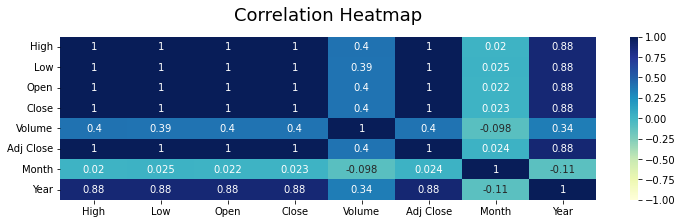

In [24]:
Plo.plot_corr(EDPR)

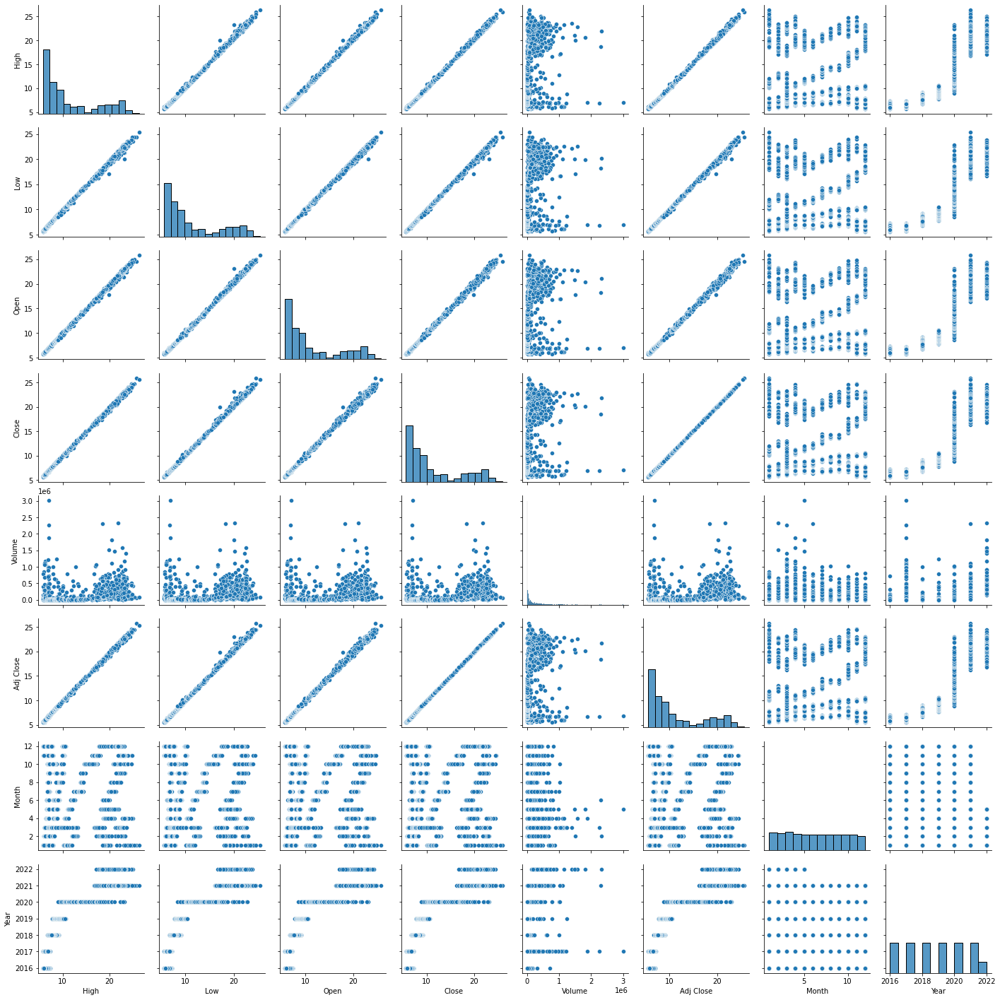

In [25]:
sns.pairplot(EDPR)

<AxesSubplot:>

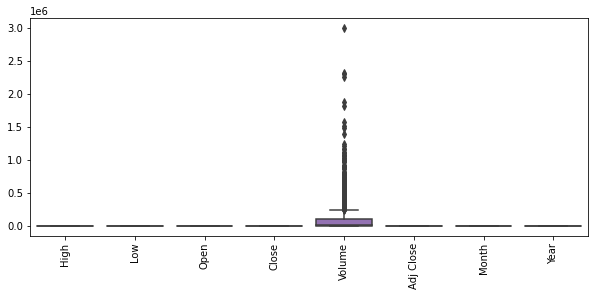

In [26]:
# Initialize the figure with a logarithmic x axis
f, ax = plt.subplots(figsize=(10,4))
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
sns.boxplot(data=EDPR)

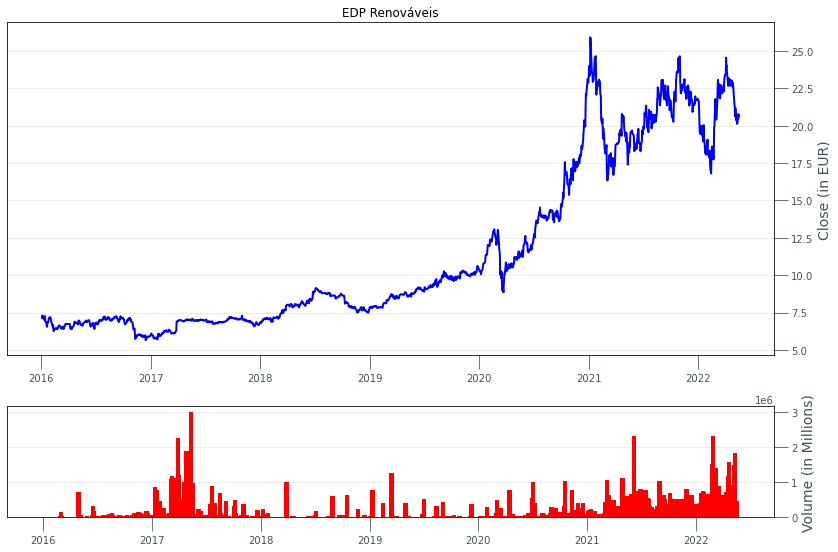

In [27]:
Plo.Close_Vol(EDPR, 'EDP Renováveis')

In [28]:
# We selected the main column  for us
close_EDPR= EDPR['Close']

close_EDPR = pd.DataFrame(close_EDPR).dropna().rename(columns= {0: 'Date', 1: 'Close'})
close_EDPR.head()

,Close
Date,
2016-01-04,7.13510
2016-01-05,7.30060
2016-01-06,7.21513
2016-01-07,7.21950
2016-01-08,7.19650


In [29]:
close_EDPR.tail()

,Close
Date,
2022-05-12,20.120001
2022-05-13,20.337500
2022-05-16,20.480000
2022-05-17,20.754999
2022-05-18,20.639999


In [30]:
close_EDPR.describe()

,Close
count,1612.000000
mean,11.402994
std,5.612058
min,5.649900
25%,7.008835
50%,8.731250
75%,15.562500
max,25.900000


In [31]:
EDPR_df = close_EDPR

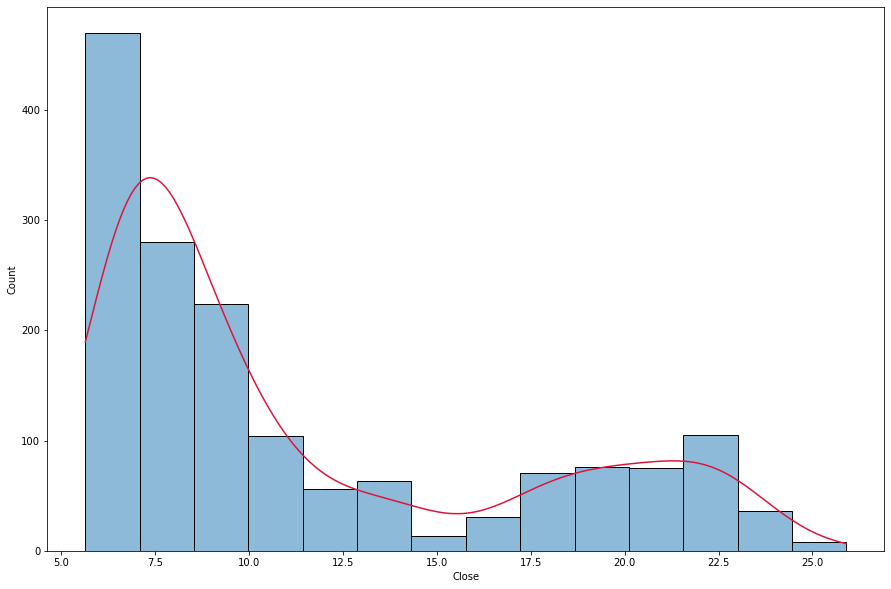

In [32]:
figsize=(3,3)
ax= sns.histplot(EDPR_df['Close'], kde=True);
ax.lines[0].set_color('crimson')

In [33]:
EDPR_df.to_csv("EDPR_df.csv")

In [34]:
EDPR_df= pd.read_csv('EDPR_df.csv')#We decided works with a CSV for modeling 
EDPR_df.tail()

,Date,Close
1607,2022-05-12,20.120001
1608,2022-05-13,20.337500
1609,2022-05-16,20.480000
1610,2022-05-17,20.754999
1611,2022-05-18,20.639999


In [35]:
EDPR_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1612 entries, 0 to 1611
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    1612 non-null   object 
 1   Close   1612 non-null   float64
dtypes: float64(1), object(1)
memory usage: 25.3+ KB


#### B.- Vestas Wind Systems A/S (0NMK.IL)

In [36]:
VWS.head()

,High,Low,Open,Close,Volume,Adj Close,WeekDay,Month,Year
Date,,,,,,,,,
2016-01-04,483.998474,475.468903,473.500000,475.468903,2528.0,464.095398,Monday,1,2016
2016-01-05,476.799988,465.432190,479.899994,475.200012,1738.0,463.832916,Tuesday,1,2016
2016-01-06,476.299988,459.814911,476.299988,468.399994,8847.0,457.195557,Wednesday,1,2016
2016-01-07,464.006683,448.768188,457.125000,460.307312,1021.0,449.296448,Thursday,1,2016
2016-01-08,465.361145,449.641602,457.500000,458.308014,6636.0,447.345001,Friday,1,2016


In [37]:
VWS.describe()

,High,Low,Open,Close,Volume,Adj Close,Month,Year
count,1612.000000,1612.000000,1612.000000,1612.000000,1.612000e+03,1612.000000,1612.000000,1612.000000
mean,421.586063,411.697092,416.630439,416.528285,2.137760e+05,410.635744,6.310174,2018.705955
std,156.396840,154.217640,155.217419,155.263216,3.951506e+05,152.130543,3.463467,1.849492
min,115.360001,113.000000,113.059998,115.260002,0.000000e+00,114.276527,1.000000,2016.000000
25%,251.518574,244.492859,248.854195,248.257240,3.210025e+04,246.958286,3.000000,2017.000000
50%,445.833405,436.933258,440.795151,441.096542,7.823800e+04,432.666290,6.000000,2019.000000
75%,553.646088,542.902710,548.849991,548.061447,2.024185e+05,539.504639,9.000000,2020.000000
max,730.728699,719.700012,724.500000,719.700012,4.502410e+06,711.659607,12.000000,2022.000000


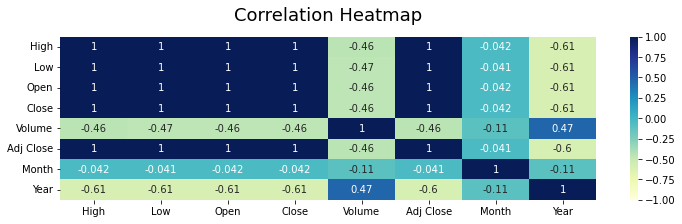

In [38]:
Plo.plot_corr(VWS)

https://www.investopedia.com/articles/active-trading/090115/use-market-volume-data-determine-bottom.asp

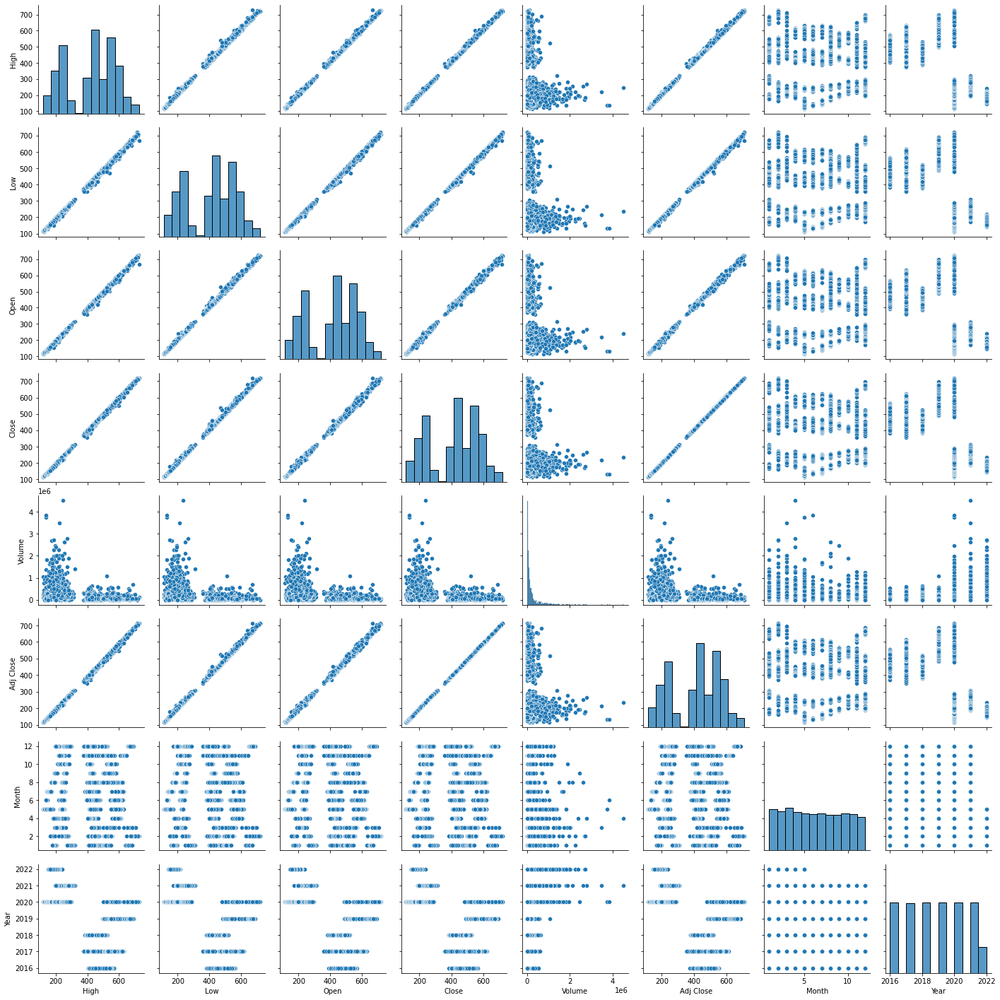

In [39]:
sns.pairplot(VWS)

<AxesSubplot:>

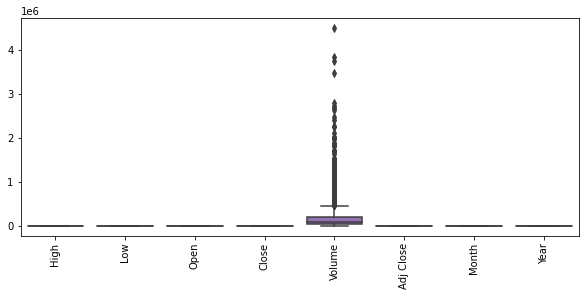

In [40]:
# Initialize the figure with a logarithmic x axis
f, ax = plt.subplots(figsize=(10,4))
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
sns.boxplot(data=VWS)

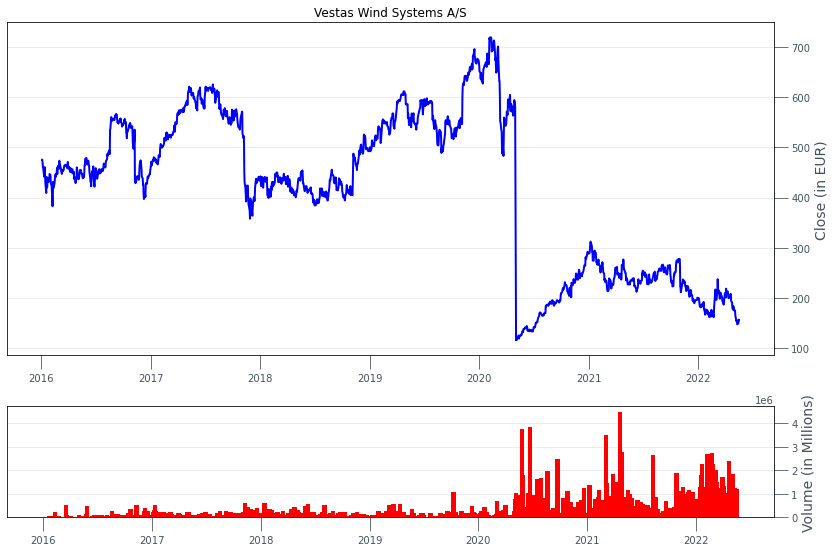

In [41]:
Plo.Close_Vol(VWS, 'Vestas Wind Systems A/S')

In [42]:
# We selected the main column  for us
close_VWS= VWS['Close']

close_VWS= pd.DataFrame(close_VWS).dropna().rename(columns= {0: 'Date', 1: 'Close'})
close_VWS.tail()

,Close
Date,
2022-05-12,147.080002
2022-05-13,147.080002
2022-05-16,149.149994
2022-05-17,151.960007
2022-05-18,155.850006


In [43]:
close_VWS.describe()

,Close
count,1612.000000
mean,416.528285
std,155.263216
min,115.260002
25%,248.257240
50%,441.096542
75%,548.061447
max,719.700012


In [44]:
VWS_df = close_VWS

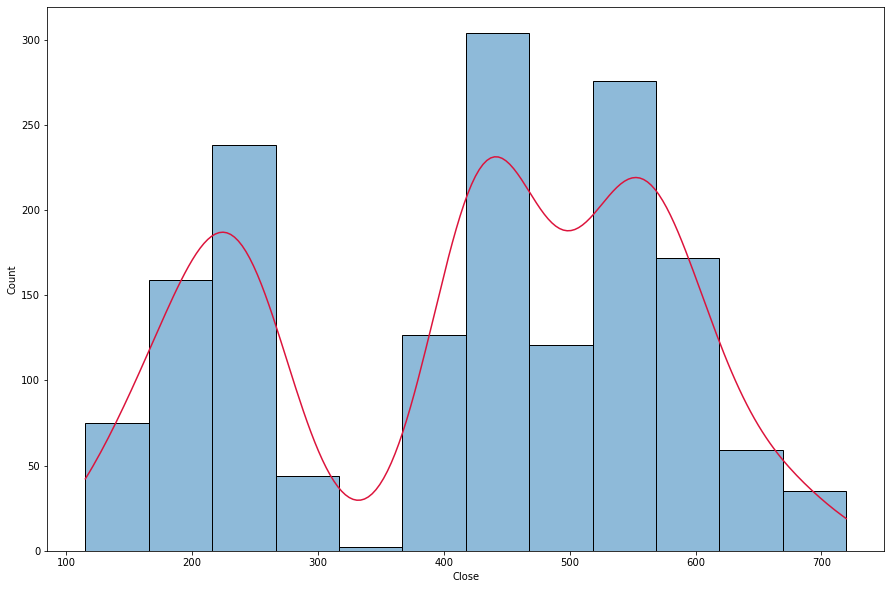

In [45]:
figsize=(3,3)
ax= sns.histplot(VWS_df['Close'], kde=True);
ax.lines[0].set_color('crimson')

In [46]:
VWS_df.to_csv("VWS_df.csv")

In [47]:
VWS_df= pd.read_csv('VWS_df.csv')#We decided works with a CSV for modeling 
VWS_df.head()

,Date,Close
0,2016-01-04,475.468903
1,2016-01-05,475.200012
2,2016-01-06,468.399994
3,2016-01-07,460.307312
4,2016-01-08,458.308014


In [48]:
VWS_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1612 entries, 0 to 1611
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    1612 non-null   object 
 1   Close   1612 non-null   float64
dtypes: float64(1), object(1)
memory usage: 25.3+ KB


In [49]:
#convert  the Date data to datatime Type
VWS_df["Date"] = pd.to_datetime(VWS_df.Date, format="%Y/%m/%d")
VWS_df.head()

,Date,Close
0,2016-01-04,475.468903
1,2016-01-05,475.200012
2,2016-01-06,468.399994
3,2016-01-07,460.307312
4,2016-01-08,458.308014


In [50]:
VWS_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1612 entries, 0 to 1611
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1612 non-null   datetime64[ns]
 1   Close   1612 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 25.3 KB


In [51]:
VWS_df = VWS_df.rename(columns={'Close': 'VWS'})
Stocks_df = VWS_df

In [52]:
Stocks_df

,Date,VWS
0,2016-01-04,475.468903
1,2016-01-05,475.200012
2,2016-01-06,468.399994
3,2016-01-07,460.307312
4,2016-01-08,458.308014
...,...,...
1607,2022-05-12,147.080002
1608,2022-05-13,147.080002
1609,2022-05-16,149.149994
1610,2022-05-17,151.960007


In [53]:
Stocks_df["EDPR"] = EDPR_df["Close"]

In [54]:
Stocks_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1612 entries, 0 to 1611
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1612 non-null   datetime64[ns]
 1   VWS     1612 non-null   float64       
 2   EDPR    1612 non-null   float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 37.9 KB


In [55]:
Stocks_df

,Date,VWS,EDPR
0,2016-01-04,475.468903,7.135100
1,2016-01-05,475.200012,7.300600
2,2016-01-06,468.399994,7.215130
3,2016-01-07,460.307312,7.219500
4,2016-01-08,458.308014,7.196500
...,...,...,...
1607,2022-05-12,147.080002,20.120001
1608,2022-05-13,147.080002,20.337500
1609,2022-05-16,149.149994,20.480000
1610,2022-05-17,151.960007,20.754999


In [56]:
Stocks_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1612 entries, 0 to 1611
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1612 non-null   datetime64[ns]
 1   VWS     1612 non-null   float64       
 2   EDPR    1612 non-null   float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 37.9 KB


In [57]:
Stocks_df.tail()

,Date,VWS,EDPR
1607,2022-05-12,147.080002,20.120001
1608,2022-05-13,147.080002,20.337500
1609,2022-05-16,149.149994,20.480000
1610,2022-05-17,151.960007,20.754999
1611,2022-05-18,155.850006,20.639999


In [58]:
import plotly.express as px
graphic = px.line(title = 'Stock price history')
for i in Stocks_df.columns[1:]:
  graphic.add_scatter(x = Stocks_df['Date'], y = Stocks_df[i], name = i)
graphic.show()

In [59]:
#Splinting into X/y
X = Stocks_df.drop('Date', axis=1)
y= Stocks_df['Date']
Stocks_normalized = X
Stocks_normalized.head()

,VWS,EDPR
0,475.468903,7.13510
1,475.200012,7.30060
2,468.399994,7.21513
3,460.307312,7.21950
4,458.308014,7.19650


In [60]:
#scaling
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0,1))
scaler.fit(Stocks_normalized)
Stocks = scaler.transform(Stocks_normalized)
DF= pd.DataFrame(Stocks)
DF.rename(columns= {0: 'EDPR', 1: 'VWS'}, inplace=True)
X = DF
X['Date'] = y
X.set_index(X.columns[-1], inplace=True)
X.reset_index(inplace=True)
Stock_norm = X

In [61]:
Stock_norm.head()

,Date,EDPR,VWS
0,2016-01-04,0.595938,0.073343
1,2016-01-05,0.595493,0.081516
2,2016-01-06,0.584243,0.077295
3,2016-01-07,0.570855,0.077511
4,2016-01-08,0.567547,0.076375


In [62]:
Stock_norm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1612 entries, 0 to 1611
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1612 non-null   datetime64[ns]
 1   EDPR    1612 non-null   float64       
 2   VWS     1612 non-null   float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 37.9 KB


In [63]:
#Visualizing the graphic with the normalized data

graphic_norm = px.line(title = 'Stock price history')
for i in Stock_norm.columns[1:]:
  graphic_norm.add_scatter(x = Stock_norm['Date'], y = Stock_norm[i], name = i)
graphic_norm.show()

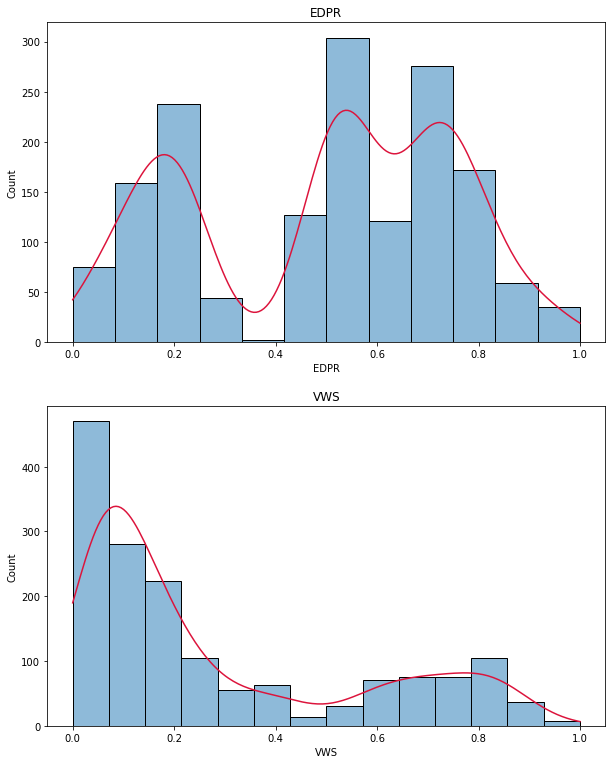

In [64]:
import numpy as np
plt.figure(figsize=(10,20))
i = 1
for i in np.arange(1, len(Stock_norm.columns)):
    plt.subplot(3, 1, i + 1)
    ax=sns.histplot(Stock_norm[Stock_norm.columns[i]], kde = True)
    ax.lines[0].set_color('crimson')
    plt.title(Stock_norm.columns[i])

### II.1- ETS-Decomposition


ETS-Decomposition is a method that allows us to visualize the data after a decomposition of time series into three distinct components: trend, seasonality, and noise.

* Additive decomposition: yt = St + Tt + Rt
* Multiplicative decomposition: yt = St * Tt * Rt

where, 
- S represents the Seasonal variation
- T encodes Trend plus Cycle
- R describes the Residual or the Error component.
Daitan (2019)

In [65]:
# graphs to show seasonal_decompose
def ETS_Decomposition (timeseries):
    decomposition = sm.tsa.seasonal_decompose(timeseries, model='mul',freq=30)
    fig = decomposition.plot()
    fig.set_size_inches(14,7)
    plt.show()

#### A.- EDP Renováveis (0ML1.IL)

In [66]:
dateparse = lambda dates: pd.datetime.strptime(dates, '%Y-%m-%d')
EDPR= pd.read_csv('EDPR.csv',index_col='Date',parse_dates=['Date'],date_parser=dateparse, dayfirst=True)
EDPR.head(2)

,High,Low,Open,Close,Volume,Adj Close,WeekDay,Month,Year
Date,,,,,,,,,
2016-01-04,7.1351,7.1351,7.1351,7.1351,0.0,6.866566,Monday,1,2016
2016-01-05,7.3006,7.3006,7.3006,7.3006,150.0,7.025837,Tuesday,1,2016


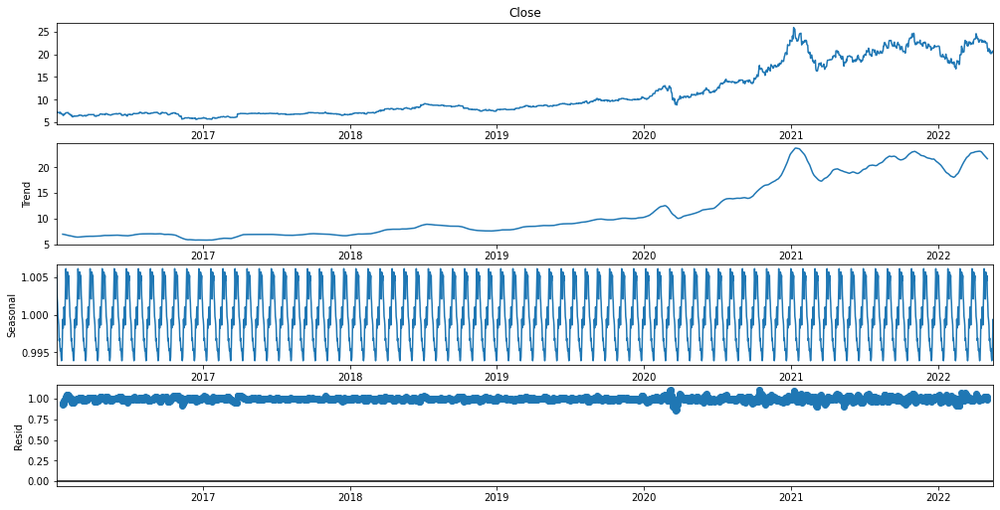

In [67]:
Plo.ETS_Decomposition(EDPR['Close'])

#### B.- Vestas Wind Systems A/S (0NMK.IL)

In [68]:
dateparse = lambda dates: pd.datetime.strptime(dates, '%Y-%m-%d')
VWS= pd.read_csv('VWS.csv',index_col='Date', parse_dates=['Date'],date_parser=dateparse, dayfirst=True)
VWS.head(2)

,High,Low,Open,Close,Volume,Adj Close,WeekDay,Month,Year
Date,,,,,,,,,
2016-01-04,483.998474,475.468903,473.500000,475.468903,2528.0,464.095398,Monday,1,2016
2016-01-05,476.799988,465.432190,479.899994,475.200012,1738.0,463.832916,Tuesday,1,2016


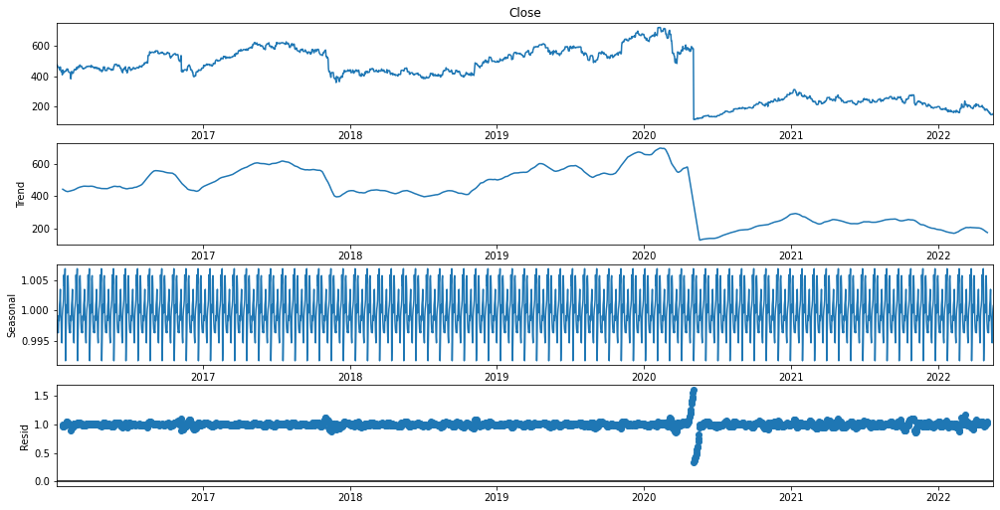

In [69]:
Plo.ETS_Decomposition (VWS['Close'])

### II.2.- Augmented Dickey–Fuller test

The Augmented Dickey-Fuller test helps us to detect if a time series is or not “stationary”. Stationary means that the data has no trend, exhibits constant variance over time, and has a constant autocorrelation structure over time. It is ‘stationarize’ the time series as part of the process of fitting a model.Zach (2021) 

In [70]:
def ADFuller(timeseries):
    result = adfuller(timeseries, autolag='AIC')
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t{}: {} - The data is {} stationary with {}% confidence'.format(key, value, 'not' if value < result[0] else '', 100-int(key[:-1])))
        

#### A.- EDP Renováveis (0ML1.IL)

In [71]:
ADFuller(EDPR['Close'])

ADF Statistic: -0.646314
p-value: 0.860170
Critical Values:
	1%: -3.4331827903052226 - The data is not stationary with 99% confidence
	5%: -2.862791466726278 - The data is not stationary with 95% confidence
	10%: -2.5674362118092295 - The data is not stationary with 90% confidence


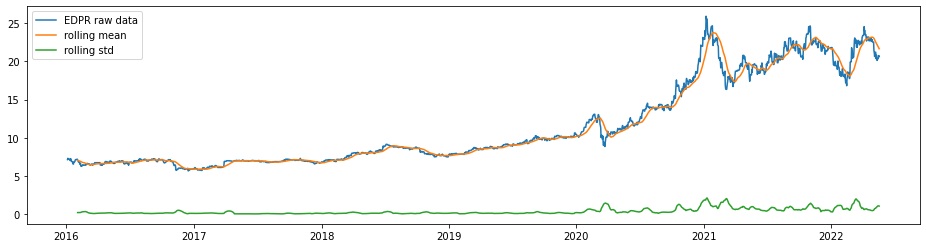

In [72]:
Plo.plot_stationarity(EDPR['Close'],'EDPR raw data')

#### B.- Vestas Wind Systems A/S (0NMK.IL)

In [73]:
ADFuller(VWS['Close'])

ADF Statistic: -1.580715
p-value: 0.493273
Critical Values:
	1%: -3.4331645018756975 - The data is not stationary with 99% confidence
	5%: -2.8627833910976266 - The data is not stationary with 95% confidence
	10%: -2.5674319121464415 - The data is not stationary with 90% confidence


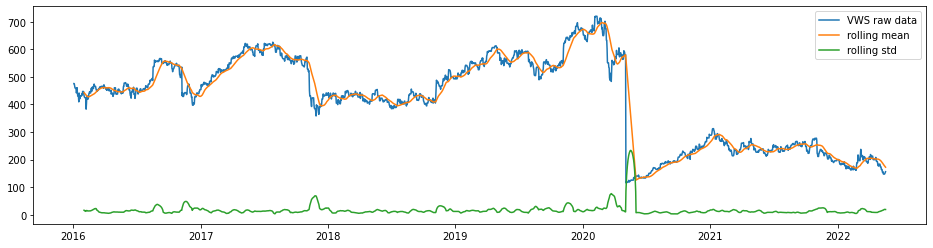

In [74]:
Plo.plot_stationarity(VWS['Close'],'VWS raw data')

### II.3.- Make the Data Stationary

### II.3.1.- Detrending: 

- Removing the underlying trend in the time series.

#### A.- EDP Renováveis (0ML1.IL)

ADF Statistic: -11.022880
p-value: 0.000000
Critical Values:
	1%: -3.43320007524933 - The data is  stationary with 99% confidence
	5%: -2.8627990992000947 - The data is  stationary with 95% confidence
	10%: -2.567440275533058 - The data is  stationary with 90% confidence


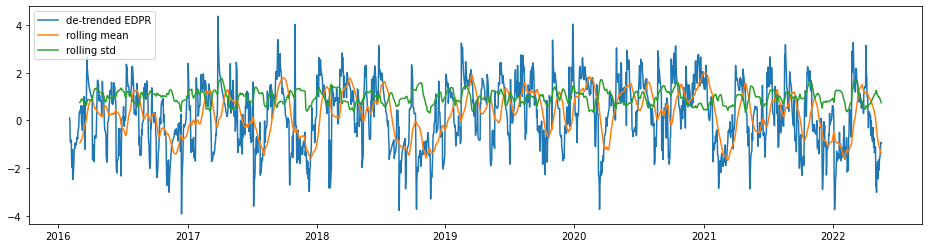

In [75]:
EDPR['Detrend']=  (EDPR['Close'] - EDPR['Close'].rolling(30).mean())/EDPR['Close'].rolling(30).std().dropna()
Plo.plot_stationarity(EDPR['Detrend'],'de-trended EDPR')
ADFuller(EDPR['Detrend'].dropna(inplace=False))

#### B.- Vestas Wind Systems A/S (0NMK.IL)

ADF Statistic: -10.221830
p-value: 0.000000
Critical Values:
	1%: -3.4332013179632686 - The data is  stationary with 99% confidence
	5%: -2.862799647940788 - The data is  stationary with 95% confidence
	10%: -2.5674405676968886 - The data is  stationary with 90% confidence


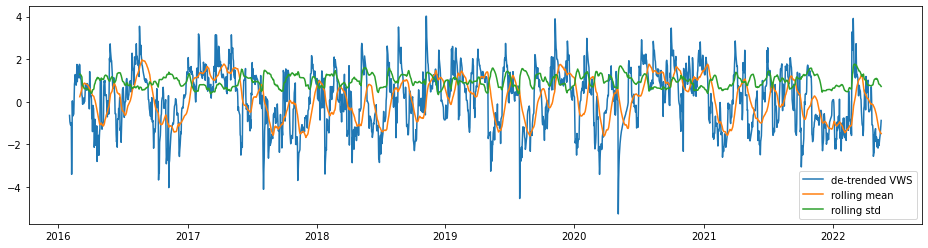

In [76]:
VWS['Detrend'] =  (VWS['Close'] - VWS['Close'].rolling(30).mean())/VWS['Close'].rolling(30).std().dropna()
Plo.plot_stationarity(VWS['Detrend'],'de-trended VWS')
ADFuller(VWS['Detrend'].dropna(inplace=False))

### II.3.2.-  Differencing

#### A.- EDP Renováveis (0ML1.IL)

- Removing the underlying seasonal or cyclical patterns in the time series. 

In [77]:
EDPR['Differencing']=  EDPR['Close'] - EDPR['Close'].shift(1).dropna()

ADF Statistic: -11.125218
p-value: 0.000000
Critical Values:
	1%: -3.4331827903052226 - The data is  stationary with 99% confidence
	5%: -2.862791466726278 - The data is  stationary with 95% confidence
	10%: -2.5674362118092295 - The data is  stationary with 90% confidence


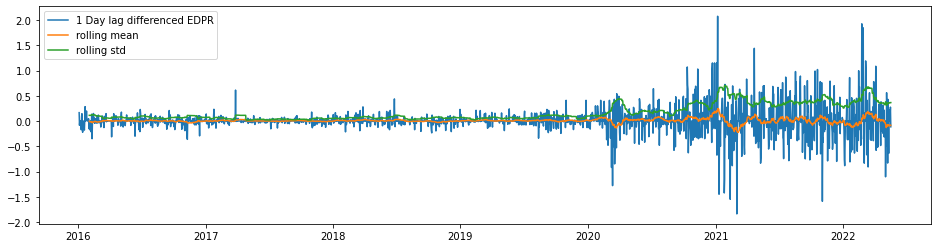

In [78]:
Plo.plot_stationarity(EDPR['Differencing'], '1 Day lag differenced EDPR')
ADFuller(EDPR['Differencing'].dropna(inplace=False))

#### B.- Vestas Wind Systems A/S (0NMK.IL)

ADF Statistic: -48.455452
p-value: 0.000000
Critical Values:
	1%: -3.4331657137546037 - The data is  stationary with 99% confidence
	5%: -2.8627839262289756 - The data is  stationary with 95% confidence
	10%: -2.567432197063244 - The data is  stationary with 90% confidence


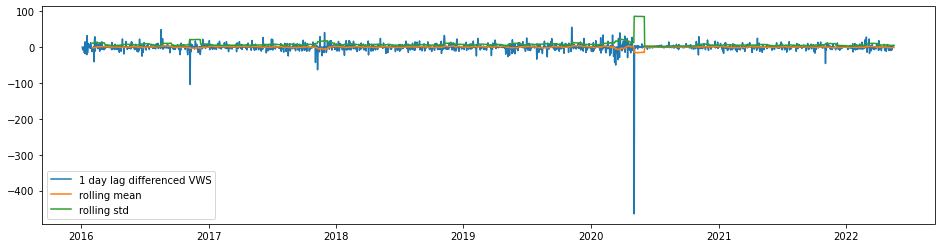

In [79]:
VWS['Differencing'] =  VWS['Close'] - VWS['Close'].shift(1).dropna()

Plo.plot_stationarity(VWS['Differencing'], '1 day lag differenced VWS')
ADFuller(VWS['Differencing'].dropna(inplace=False))

### II.3.3.-  Detrending + Differencing

- Removing the underlying trend and the seasonal or cyclical patterns in the time series.

#### A.- EDP Renováveis (0ML1.IL)

ADF Statistic: -15.689516
p-value: 0.000000
Critical Values:
	1%: -3.4332200895747174 - The data is  stationary with 99% confidence
	5%: -2.862807936825532 - The data is  stationary with 95% confidence
	10%: -2.5674449809195186 - The data is  stationary with 90% confidence


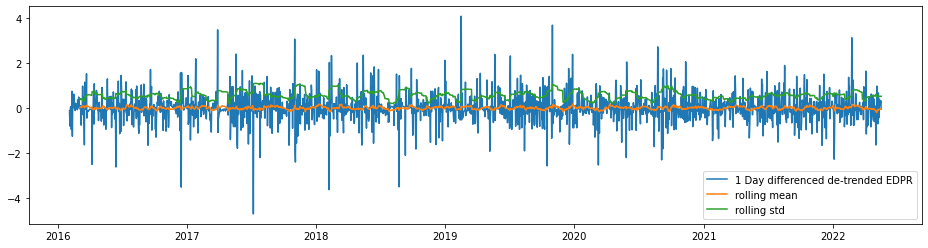

In [80]:
EDPR['Detrend_Diff']=  EDPR['Detrend']- EDPR['Detrend'].shift(1).dropna()
Plo.plot_stationarity(EDPR['Detrend_Diff'],'1 Day differenced de-trended EDPR')
ADFuller(EDPR['Detrend_Diff'].dropna(inplace=False))

#### B.- Vestas Wind Systems A/S (0NMK.IL)

ADF Statistic: -17.388715
p-value: 0.000000
Critical Values:
	1%: -3.433215059686721 - The data is  stationary with 99% confidence
	5%: -2.862805715808642 - The data is  stationary with 95% confidence
	10%: -2.5674437983902245 - The data is  stationary with 90% confidence


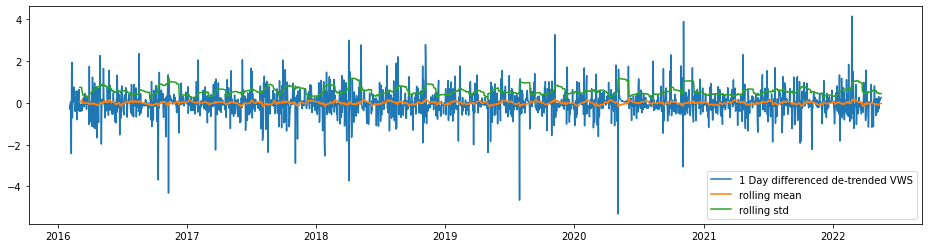

In [81]:
VWS['Detrend_Diff'] =  VWS['Detrend']- VWS['Detrend'].shift(1)

Plo.plot_stationarity(VWS['Detrend_Diff'],'1 Day differenced de-trended VWS')
ADFuller(VWS['Detrend_Diff'].dropna(inplace=False))

### II.4- Identifying AR and MA orders by ACF and PACF plots

Plotting  ACF and PACF help us to undertand how to choose the best MA(q) and AR(p) values:

- ACF= Describes how well the present value of the series is related with its past values 
- PACF= It finds correlation of the residuals

Blue bars on the plots are the error bands, everything in this area is not statistically significant.  In linear regression models performs best when the predictors are not correlated and are independent of each other. 



A Q-Q plot is a scatterplot created by plotting two sets of quantiles against one another. If both sets of quantiles came from the same distribution, we should see the points forming a line that’s roughly straight.

In [82]:
# Q-Q plot of the quantiles of x versus the quantiles/ppf of a distribution.
def plot_QQ(timeseries):
    x = sm.qqplot(timeseries, line= 's')

#### A.- EDP Renováveis (0ML1.IL)

ADF Statistic: -15.689516
p-value: 0.000000
Critical Values:
	1%: -3.4332200895747174 - The data is  stationary with 99% confidence
	5%: -2.862807936825532 - The data is  stationary with 95% confidence
	10%: -2.5674449809195186 - The data is  stationary with 90% confidence


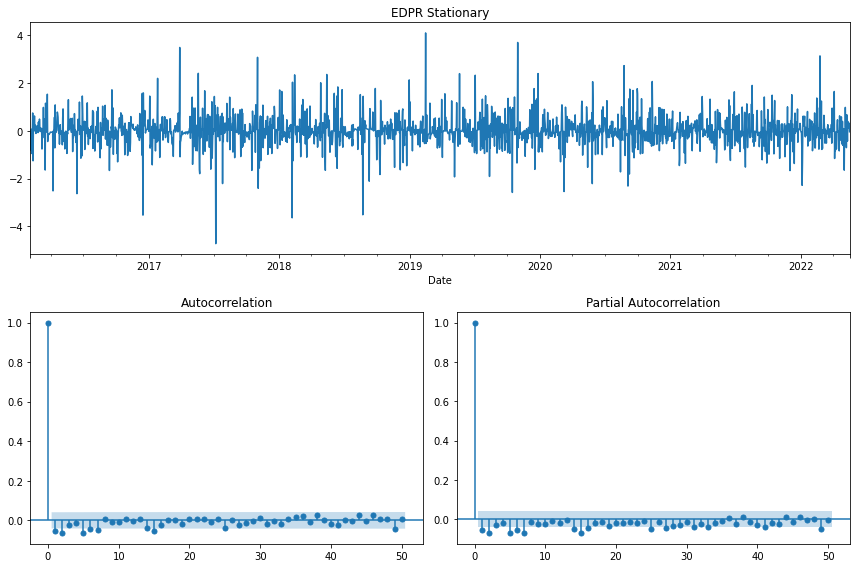

In [83]:
# Drop the first row of 'Close' column because It has 'NaN' value
ADFuller(EDPR['Detrend_Diff'].dropna(inplace=False))
Plo.plot_ACF_PACF(EDPR['Detrend_Diff'].dropna(inplace=False) , 'EDPR Stationary')

It looks like the ACF is lagged by 7 and that PACF is geometric. If both ACF and PACF plots demonstrate a gradual decreasing pattern, then the ARMA process should be considered for modelling.

<a href="https://towardsdatascience.com/identifying-ar-and-ma-terms-using-acf-and-pacf-plots-in-time-series-forecasting-ccb9fd073db8">Masum, M. (2020) </a>


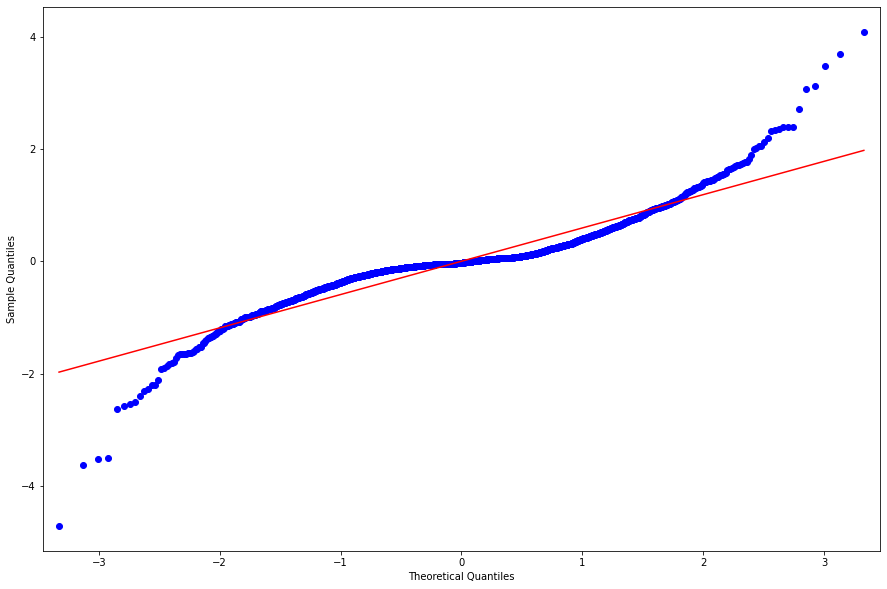

In [84]:
plot_QQ(EDPR['Detrend_Diff'].dropna())

#### B.- Vestas Wind Systems A/S (0NMK.IL)

ADF Statistic: -15.689516
p-value: 0.000000
Critical Values:
	1%: -3.4332200895747174 - The data is  stationary with 99% confidence
	5%: -2.862807936825532 - The data is  stationary with 95% confidence
	10%: -2.5674449809195186 - The data is  stationary with 90% confidence


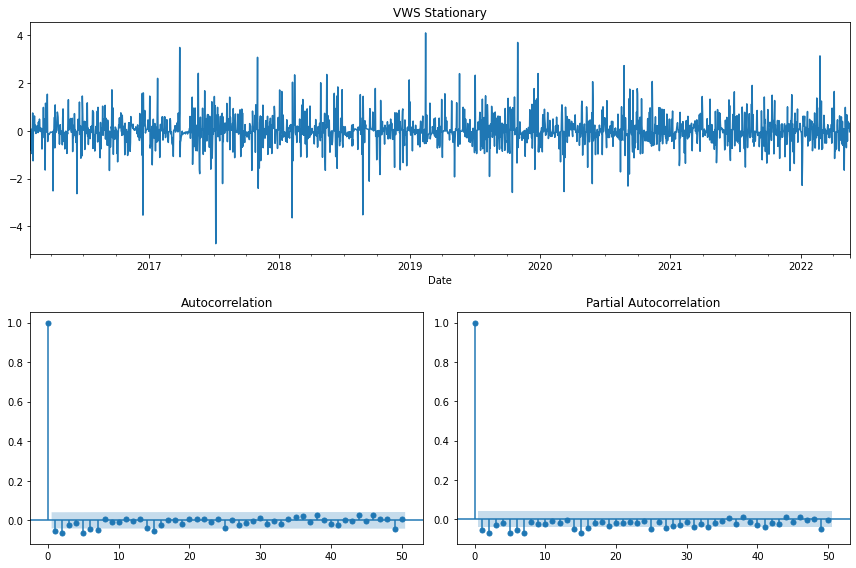

In [85]:
# Drop the first row of 'Close' column because It has 'NaN' value
ADFuller(EDPR['Detrend_Diff'].dropna(inplace=False))
Plo.plot_ACF_PACF(EDPR['Detrend_Diff'].dropna(inplace=False) , 'VWS Stationary')

It looks like the ACF is lagged by 3 and that PACF is geometric. If both ACF and PACF plots demonstrate a gradual decreasing pattern, then the ARMA process should be considered for modelling. 
<a href="https://towardsdatascience.com/identifying-ar-and-ma-terms-using-acf-and-pacf-plots-in-time-series-forecasting-ccb9fd073db8">Masum, M. (2020) </a>


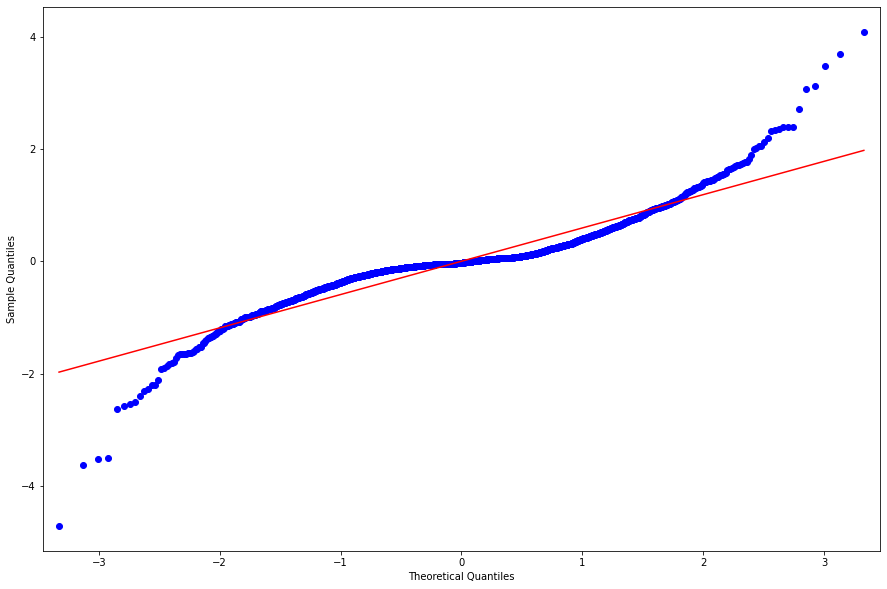

In [86]:
plot_QQ(EDPR['Detrend_Diff'].dropna(inplace=False))

### III.-Modelling

#### A.- EDP Renováveis (0ML1.IL)

In [87]:
from sklearn.model_selection import TimeSeriesSplit

In [88]:
#Specify fold and perform splitting
tscv = TimeSeriesSplit(n_splits=3)
tscv.split(EDPR)

#Find out no of observations in train and test sets
i=0
for train_A, test_A in tscv.split(EDPR):
    i=i+1
    print ("Shape EDPR train%s=%s" % (i, len(train_A)))
    print ("Shape EDPR test%s=%s" % (i, len(test_A)))

Shape EDPR train1=584
Shape EDPR test1=581
Shape EDPR train2=1165
Shape EDPR test2=581
Shape EDPR train3=1746
Shape EDPR test3=581


In [89]:
#Splitting according to the above description
trainA1, testA1 = EDPR.iloc[:500, 0], EDPR.iloc[500:890, 0]
trainA2, testA2 = EDPR.iloc[:890, 0], EDPR.iloc[890:1080, 0]
trainA3, testA3 = EDPR.iloc[:1080, 0], EDPR.iloc[1080:1240, 0]

In [90]:
# Divide into train and validation set to calculate R-squared score and mean absolute percentage error 
train_A = EDPR[:int(0.85 * (len(EDPR)))]
test_A  = EDPR[int(0.85 * (len(EDPR))):]
train_A.shape, test_A.shape

((1977, 12), (350, 12))

#### B.- Vestas Wind Systems A/S (0NMK.IL)

In [91]:
#Specify fold and perform splitting
tscv = TimeSeriesSplit(n_splits=3)
tscv.split(VWS)

#Find out no of observations in train and test sets
i=0
for train_B, test_B in tscv.split(VWS):
    i=i+1
    print ("VWS train%s=%s" % (i, len(train_B)))
    print ("VWS test%s=%s" % (i, len(test_B)))

VWS train1=584
VWS test1=581
VWS train2=1165
VWS test2=581
VWS train3=1746
VWS test3=581


In [92]:
# Divide into train and validation set to calculate R-squared score and mean absolute percentage error 
train_B = VWS[:int(0.85 * (len(VWS)))]
test_B  = VWS[int(0.85 * (len(VWS))):]

train_B.shape, test_B.shape

((1977, 12), (350, 12))

### III.1.- Moving Averages (MA)

-Process where the present value of series is defined as a linear combination of past errors.


In [93]:
w= 20

#### A.- EDP Renováveis (0ML1.IL)

In [94]:
#create moving average by applying a mean function to a rolling window.
EDPR['MA-RW'] = EDPR['Close'].rolling(window=w).mean()
#EDPR.head()

In [95]:
#create moving average by applying a mean function to a ewm (Exponentially Weighted Moving Average)
EDPR['MA_EWM'] = EDPR['Close'].ewm(span=w,adjust=False).mean()
#EDPR.head()

In [96]:
#create moving average by applying Simple Exponential Smoothing from statmodels Holt-Winters
warnings.filterwarnings('ignore') 
span = w
alpha = 2/(span+1)
EDPR['MA_SES']=SimpleExpSmoothing(EDPR['Close']).fit(smoothing_level=alpha,optimized=False).fittedvalues


##### Validating the Forecast

In [97]:
start = len(train_A)
end   = len(train_A) + len(test_A) - 1


#First fold RMSE
model1 = SimpleExpSmoothing(EDPR['Close']).fit()
pred1 = model1.predict(start=start , end=end)

In [98]:
# Create a dataframe to store r2 score
MA_SES_EDPR = pd.DataFrame({'r2_score': r2_score(test_A['Close'], pred1)}, index = [0])

# Add columns in the dataframe 'evaluation_results'
MA_SES_EDPR['Model'] = 'MA_SES'
MA_SES_EDPR.set_index(['Model'], inplace=True)
MA_SES_EDPR['mean_absolute_error'] = mean_absolute_error(test_A['Close'], pred1)
MA_SES_EDPR['mean_squared_error'] = mean_squared_error(test_A['Close'], pred1)
MA_SES_EDPR['root_mean_squared_error'] = np.sqrt(mean_squared_error(test_A['Close'], pred1))
MA_SES_EDPR['mean_absolute_percentage_error'] = np.mean(np.abs(pred1 - test_A['Close'])
                                                               /np.abs(test_A['Close']))*100 
# Display the results
MA_SES_EDPR

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
MA_SES,0.940094,0.261486,0.163412,0.404243,1.245338


In [99]:
#create moving average by applying Double Exponential Smoothing from statmodels Holt-Winters
EDPR['MA_Holt-Winters'] = ExponentialSmoothing(EDPR['Close'], trend='add').fit().fittedvalues



##### Validating the Forecast

In [100]:
start = len(train_A)
end   = len(train_A) + len(test_A) - 1


#First fold RMSE
model1 = ExponentialSmoothing(EDPR['Close'], seasonal='add',trend='add', seasonal_periods=12).fit()
pred1 = model1.predict(start=start , end=end)

In [101]:
# Create a dataframe to store r2 score
MA_HoltWinters_EDPR = pd.DataFrame({'r2_score': r2_score(test_A['Close'], pred1)}, index = [0])

# Add columns in the dataframe 'evaluation_results'
MA_HoltWinters_EDPR['Model'] = 'MA_Holt-Winters'
MA_HoltWinters_EDPR.set_index(['Model'], inplace=True)
MA_HoltWinters_EDPR['mean_absolute_error'] = mean_absolute_error(test_A['Close'], pred1)
MA_HoltWinters_EDPR['mean_squared_error'] = mean_squared_error(test_A['Close'], pred1)
MA_HoltWinters_EDPR['root_mean_squared_error'] = np.sqrt(mean_squared_error(test_A['Close'], pred1))
MA_HoltWinters_EDPR['mean_absolute_percentage_error'] = np.mean(np.abs(pred1 - test_A['Close'])
                                                               /np.abs(test_A['Close']))*100 
# Display the results
MA_HoltWinters_EDPR

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
MA_Holt-Winters,0.940835,0.263929,0.16139,0.401733,1.257424


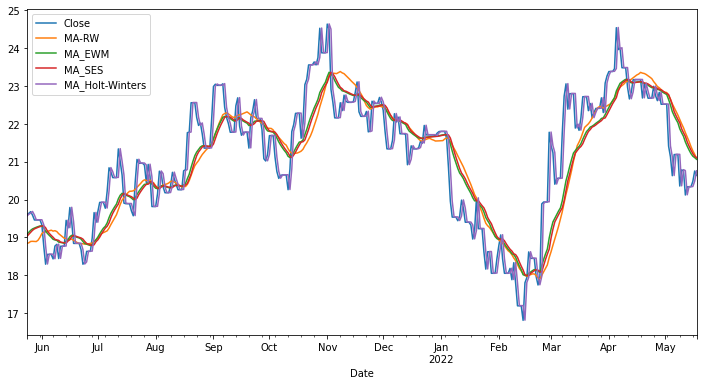

In [102]:
#Plotting the accuracy of the MA
EDPR[['Close','MA-RW','MA_EWM','MA_SES','MA_Holt-Winters']].iloc[-360:].plot(figsize=(12,6)).autoscale(axis='x',tight=True);

#### B.- Vestas Wind Systems A/S (0NMK.IL)

In [103]:
#create moving average by applying a mean function to a rolling window.
VWS['MA-RW'] = VWS['Close'].rolling(window=w).mean()
#VWS.head()

In [104]:
#create moving average by applying a mean function to a ewm (Exponentially Weighted Moving Average)
VWS['MA_EWM'] = VWS['Close'].ewm(span=w,adjust=False).mean()
#VWS.head()

In [105]:
warnings.filterwarnings('ignore') 
#create moving average by applying Simple Exponential Smoothing from statmodels Holt-Winters
span = w
alpha = 2/(span+1)
VWS.asfreq(freq='b')
VWS['MA_SES']=SimpleExpSmoothing(VWS['Close']).fit(smoothing_level=alpha,optimized=False).fittedvalues

##### Validating the Forecast

In [106]:
start = len(train_B)
end   = len(train_B) + len(test_B) - 1

model2 = ExponentialSmoothing(VWS['Close'], seasonal='mul',trend='add', seasonal_periods=12).fit()
pred2 = model2.predict(start=start , end=end)

In [107]:
# Create a dataframe to store r2 score
MA_SES_VWS = pd.DataFrame({'r2_score': r2_score(test_B['Close'], pred2)}, index = [0])

# Add columns in the dataframe 'evaluation_results'
MA_SES_VWS['Model'] = 'MA_SES'
MA_SES_VWS.set_index(['Model'], inplace=True)
MA_SES_VWS['mean_absolute_error'] = mean_absolute_error(test_B['Close'], pred2)
MA_SES_VWS['mean_squared_error'] = mean_squared_error(test_B['Close'], pred2)
MA_SES_VWS['root_mean_squared_error'] = np.sqrt(mean_squared_error(test_B['Close'], pred2))
MA_SES_VWS['mean_absolute_percentage_error'] = np.mean(np.abs(pred2 - test_B['Close'])
                                                               /np.abs(test_B['Close']))*100 
# Display the results
MA_SES_VWS

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
MA_SES,0.956506,4.521095,43.921238,6.62731,2.11333


In [108]:
#create moving average by applying Double Exponential Smoothing from statmodels Holt-Winters
VWS['MA_Holt-Winters'] = ExponentialSmoothing(VWS['Close'], trend='add').fit().fittedvalues

In [109]:
start = len(train_B)
end   = len(train_B) + len(test_B) - 1

model2 = ExponentialSmoothing(VWS['Close'], seasonal='mul',trend='add', seasonal_periods=12).fit()
pred2 = model2.predict(start=start , end=end)

In [110]:
# Create a dataframe to store r2 score
MA_HoltWinters_VWS = pd.DataFrame({'r2_score': r2_score(test_B['Close'], pred2)}, index = [0])

# Add columns in the dataframe 'evaluation_results'
MA_HoltWinters_VWS['Model'] = 'MA_Holt-Winters'
MA_HoltWinters_VWS.set_index(['Model'], inplace=True)
MA_HoltWinters_VWS['mean_absolute_error'] = mean_absolute_error(test_B['Close'], pred2)
MA_HoltWinters_VWS['mean_squared_error'] = mean_squared_error(test_B['Close'], pred2)
MA_HoltWinters_VWS['root_mean_squared_error'] = np.sqrt(mean_squared_error(test_B['Close'], pred2))
MA_HoltWinters_VWS['mean_absolute_percentage_error'] = np.mean(np.abs(pred2 - test_B['Close'])
                                                               /np.abs(test_B['Close']))*100 
# Display the results
MA_HoltWinters_VWS

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
MA_Holt-Winters,0.956506,4.521095,43.921238,6.62731,2.11333


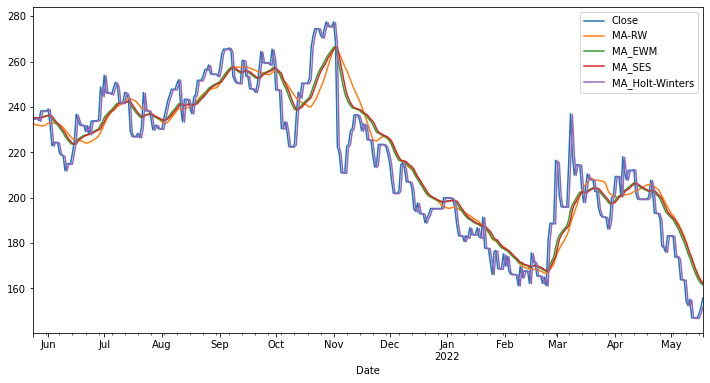

In [111]:
#Plotting the accuracy of the MA
VWS[['Close','MA-RW','MA_EWM','MA_SES','MA_Holt-Winters']].iloc[-360:].plot(figsize=(12,6)).autoscale(axis='x',tight=True);

### III.2.- ARMA

#### A.- EDP Renováveis (0ML1.IL)

Month: 20 working days

In [112]:
arma_EDPR = smtsa.ARMA(EDPR['Close'].tolist(), order=(1, 0)).fit(maxlag=20, method='mle', trend='nc') 

In [113]:
EDPR['ARMA']= arma_EDPR.predict()
arma_EDPR.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                      y   No. Observations:                 2327
Model:                     ARMA(1, 0)   Log Likelihood                  96.808
Method:                           mle   S.D. of innovations              0.232
Date:                Thu, 19 May 2022   AIC                           -189.617
Time:                        21:01:48   BIC                           -178.112
Sample:                             0   HQIC                          -185.425
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1.y        0.9999      0.000   6408.215      0.000       1.000       1.000
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.0001           +0.0000j            1.0001            0.0000
-----------------------------------------------------------------------------
"""

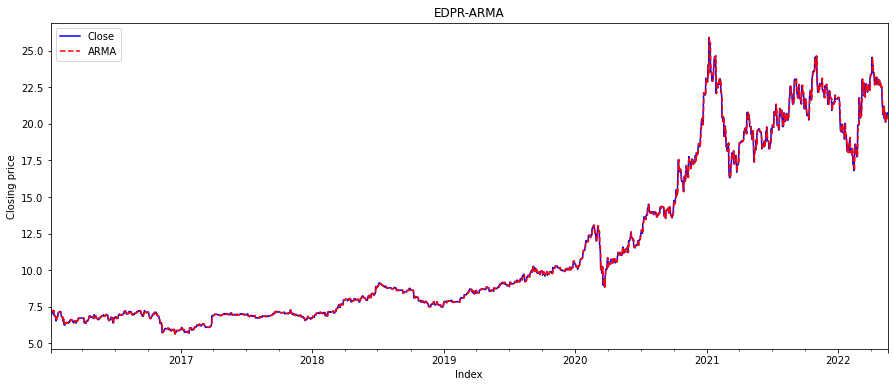

In [114]:
Plo.plot_models(EDPR['Close'], EDPR['ARMA'], 'EDPR-ARMA')

##### Validating the Forecast

In [115]:
start = len(train_A)
end   = len(train_A) + len(test_A) - 1
predictions = arma_EDPR.predict(start = start, end = end, dynamic = False, typ = 'levels')

# Create a dataframe to store r2 score
R_arma_EDPR = pd.DataFrame({'r2_score': r2_score(test_A['Close'], predictions)}, index = [0])

# Add columns in the dataframe 'evaluation_results'
R_arma_EDPR['Model'] = 'ARMA'
R_arma_EDPR.set_index(['Model'], inplace=True)
R_arma_EDPR['mean_absolute_error'] = mean_absolute_error(test_A['Close'], predictions)
R_arma_EDPR['mean_squared_error'] = mean_squared_error(test_A['Close'], predictions)
R_arma_EDPR['root_mean_squared_error'] = np.sqrt(mean_squared_error(test_A['Close'], predictions))
R_arma_EDPR['mean_absolute_percentage_error'] = np.mean(np.abs(predictions - test_A['Close'])
                                                               /np.abs(test_A['Close']))*100 
# Display the results
R_arma_EDPR

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
ARMA,0.940089,0.262234,0.163425,0.404258,1.248786


#### B.- Vestas Wind Systems A/S (0NMK.IL)

In [116]:
VWS=VWS.dropna()

In [117]:
arma_VWS = smtsa.ARMA(VWS['Close'].tolist(), order=(12, 0)).fit(maxlag=20, method='mle', trend='c') 

In [118]:
VWS['ARMA']= arma_VWS.predict()
arma_VWS.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                      y   No. Observations:                 2297
Model:                    ARMA(12, 0)   Log Likelihood               -9043.912
Method:                           mle   S.D. of innovations             12.394
Date:                Thu, 19 May 2022   AIC                          18115.825
Time:                        21:02:06   BIC                          18196.176
Sample:                             0   HQIC                         18145.121
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        387.1072     77.247      5.011      0.000     235.707     538.508
ar.L1.y        0.9967      0.021     47.791      0.000       0.956       1.038
ar.L2.y       -0.0028      0.029     -0.095      0.924      -0.061       0.055
ar.L3.y        0.0299      0.029      1.017      0.309      -0.028       0.088
ar.L4.y       -0.0236      0.029     -0.801      0.423      -0.081       0.034
ar.L5.y        0.0065      0.029      0.219      0.826      -0.051       0.064
ar.L6.y       -0.0500      0.030     -1.695      0.090      -0.108       0.008
ar.L7.y        0.0362      0.030      1.228      0.219      -0.022       0.094
ar.L8.y       -0.0262      0.030     -0.885      0.376      -0.084       0.032
ar.L9.y        0.0258      0.030      0.873      0.382      -0.032       0.084
ar.L10.y       0.0400      0.030      1.354      0.176      -0.018       0.098
ar.L11.y      -0.0374      0.030     -1.266      0.206      -0.095       0.021
ar.L12.y       0.0018      0.021      0.088      0.930      -0.039       0.043
                                    Roots                                     
==============================================================================
                   Real          Imaginary           Modulus         Frequency
------------------------------------------------------------------------------
AR.1            -1.1233           -0.7487j            1.3499           -0.4064
AR.2            -1.1233           +0.7487j            1.3499            0.4064
AR.3            -1.4934           -0.0000j            1.4934           -0.5000
AR.4            -0.4196           -1.2927j            1.3591           -0.3000
AR.5            -0.4196           +1.2927j            1.3591            0.3000
AR.6             0.4091           -1.3024j            1.3652           -0.2016
AR.7             0.4091           +1.3024j            1.3652            0.2016
AR.8             1.0030           -0.0000j            1.0030           -0.0000
AR.9             1.1860           -0.7299j            1.3926           -0.0878
AR.10            1.1860           +0.7299j            1.3926            0.0878
AR.11            1.5572           -0.0000j            1.5572           -0.0000
AR.12           19.1548           -0.0000j           19.1548           -0.0000
------------------------------------------------------------------------------
"""

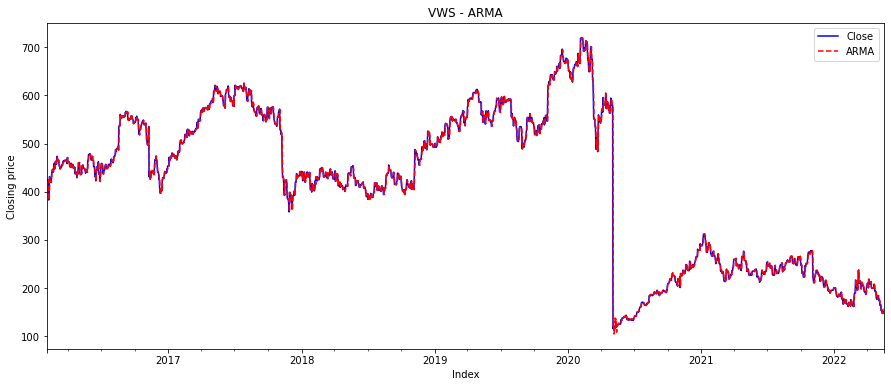

In [119]:
Plo.plot_models(VWS['Close'], VWS['ARMA'], 'VWS - ARMA')

##### Validating the Forecast

In [120]:
start = len(train_B)
end   = len(train_B) + len(test_B) - 1
predictions = arma_VWS.predict(start = start, end = end, dynamic = False, typ = 'levels')

In [121]:
# Create a dataframe to store r2 score
R_arma_VWS = pd.DataFrame({'r2_score': r2_score(test_B['Close'], predictions)}, index = [0])

# Add columns in the dataframe 'evaluation_results'
R_arma_VWS['Model'] = 'ARMA'
R_arma_VWS.set_index(['Model'], inplace=True)
R_arma_VWS['mean_absolute_error'] = mean_absolute_error(test_B['Close'], predictions)
R_arma_VWS['mean_squared_error'] = mean_squared_error(test_B['Close'], predictions)
R_arma_VWS['root_mean_squared_error'] = np.sqrt(mean_squared_error(test_B['Close'], predictions))
R_arma_VWS['mean_absolute_percentage_error'] = np.mean(np.abs(predictions - test_B['Close'])
                                                               /np.abs(test_B['Close']))*100 
# Display the results
R_arma_VWS

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
ARMA,0.385457,20.175411,620.574841,24.91134,9.650315


### III.3.- ARIMA

#### A.- EDP Renováveis (0ML1.IL)

In [122]:
# Declare and initialise an object 'arima_obj' by calling a method 'ARIMA()'
arima_obj = ARIMA(EDPR['Close'].tolist(), order = (2, 0, 1))#best model by pmdarima.auto_arima
# Train the ARIMA model by calling a method fit()
arima_EDPR= arima_obj.fit(disp = 0)
# Display the summary of the trained model
arima_EDPR.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                      y   No. Observations:                 2327
Model:                     ARMA(2, 1)   Log Likelihood                 102.049
Method:                       css-mle   S.D. of innovations              0.231
Date:                Thu, 19 May 2022   AIC                           -194.098
Time:                        21:02:25   BIC                           -165.336
Sample:                             0   HQIC                          -183.618
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.7179      4.532      2.806      0.005       3.835      21.601
ar.L1.y        0.7258      0.150      4.825      0.000       0.431       1.021
ar.L2.y        0.2732      0.150      1.817      0.069      -0.021       0.568
ma.L1.y        0.3304      0.148      2.237      0.025       0.041       0.620
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.0008           +0.0000j            1.0008            0.0000
AR.2           -3.6574           +0.0000j            3.6574            0.5000
MA.1           -3.0269           +0.0000j            3.0269            0.5000
-----------------------------------------------------------------------------
"""

In [123]:
# Declare the array 'pred' and append the values 
pred = arima_EDPR.fittedvalues.tolist()
#pred = np.append([0], arima_EDPR.fittedvalues.tolist())

In [124]:
# Add a new column 'ARIMA' into dataframe
EDPR['ARIMA'] = pred 

In [125]:
# Residues and fitted values are added and stored into dataframe

diffval = arima_EDPR.resid + arima_EDPR.fittedvalues

#diffval = np.append([0, 0],arima_EDPR.resid + arima_EDPR.fittedvalues)

In [126]:
EDPR['diffval']= diffval

In [127]:
# Display first five records
EDPR.tail()

,High,Low,Open,Close,Volume,Adj Close,WeekDay,Month,Year,Detrend,Differencing,Detrend_Diff,MA-RW,MA_EWM,MA_SES,MA_Holt-Winters,ARMA,ARIMA,diffval
Date,,,,,,,,,,,,,,,,,,,
2022-05-14,20.411119,20.100000,20.125000,20.337500,187324.0,20.337500,Friday,5,2022,-1.568708,0.0000,0.133161,21.535875,21.308569,21.410787,20.343306,20.335036,20.354732,20.337500
2022-05-15,20.411119,20.100000,20.125000,20.337500,187324.0,20.337500,Friday,5,2022,-1.454590,0.0000,0.114118,21.403000,21.216086,21.308569,20.343306,20.335036,20.324396,20.337500
2022-05-16,20.700001,20.240000,20.480000,20.480000,359647.0,20.480000,Monday,5,2022,-1.235775,0.1425,0.218815,21.289500,21.145983,21.216086,20.343306,20.335036,20.334418,20.480000
2022-05-17,20.900000,20.637939,20.754999,20.754999,452620.0,20.754999,Tuesday,5,2022,-0.919503,0.2750,0.316271,21.196500,21.108746,21.145983,20.485806,20.477519,20.481615,20.754999
2022-05-18,21.110001,20.570000,21.105000,20.639999,322236.0,20.639999,Wednesday,5,2022,-0.963839,-0.1150,-0.044336,21.086750,21.064104,21.108746,20.760805,20.752485,20.762370,20.639999


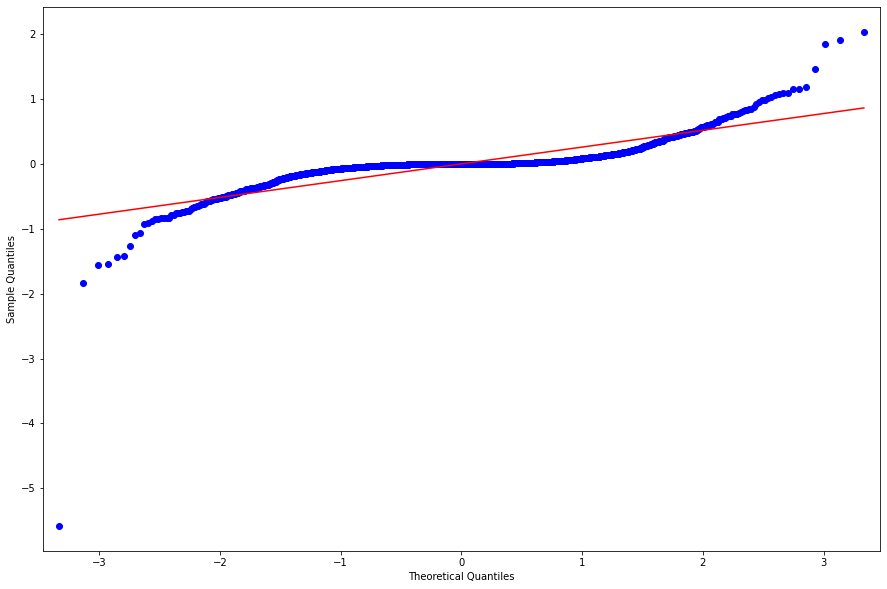

In [128]:
# Q-Q plot of the quantiles of x versus the quantiles/ppf of a distribution.
# Call qqplot() for arima_obj_fit
x = sm.qqplot(arima_EDPR.resid, line = 's')

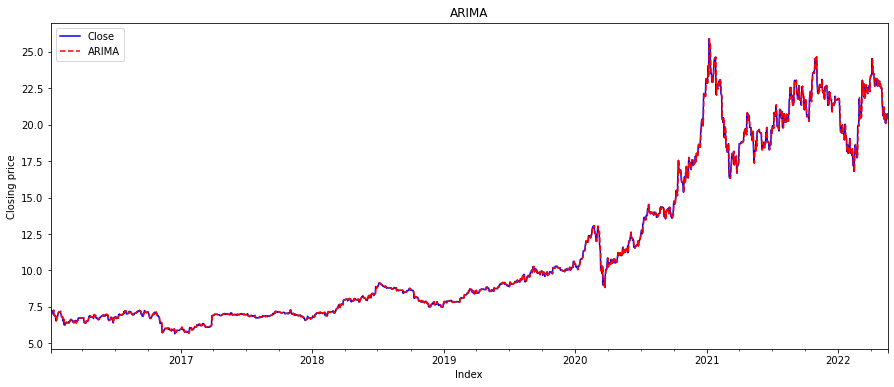

In [129]:
Plo.plot_models(EDPR['Close'], EDPR['ARIMA'], 'ARIMA')

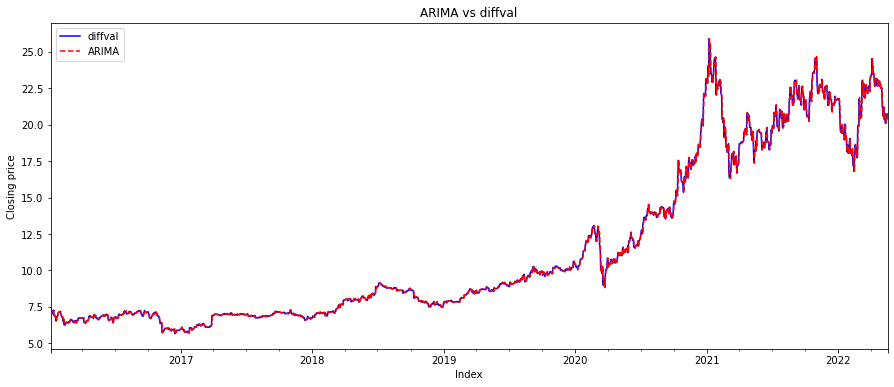

In [130]:
Plo.plot_models(EDPR['diffval'], EDPR['ARIMA'], 'ARIMA vs diffval')

Text(0, 0.5, 'Forecasted value')

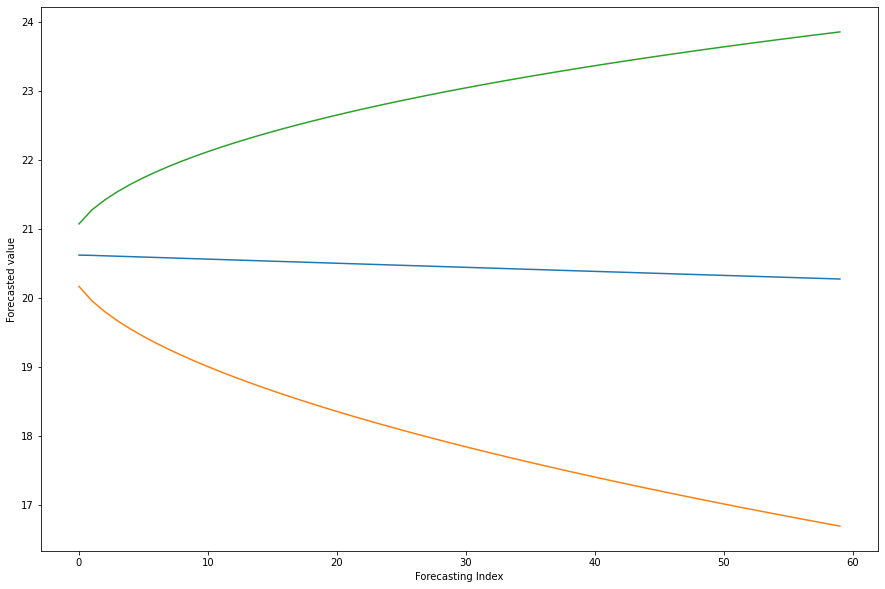

In [131]:
f, err, ci = arima_EDPR.forecast(60)
plt.plot(f)
plt.plot(ci)
plt.xlabel('Forecasting Index')
plt.ylabel('Forecasted value')
# The forecasting estimates and confidence interval obtained using the preceding script is shown in Figure

##### Validating the Forecast

In [132]:
start = len(train_A)
end   = len(train_A) + len(test_A) - 1
predictions = arima_EDPR.predict(start = start, end = end, dynamic = False, typ = 'levels')

In [133]:
# Create a dataframe to store r2 score
R_arima_EDPR = pd.DataFrame({'r2_score': r2_score(test_A['Close'], predictions)}, index = [0])

# Add columns in the dataframe 'evaluation_results'
R_arima_EDPR ['Model'] = 'ARIMA'
R_arima_EDPR .set_index(['Model'], inplace=True)
R_arima_EDPR ['mean_absolute_error'] = mean_absolute_error(test_A['Close'], predictions)
R_arima_EDPR ['mean_squared_error'] = mean_squared_error(test_A['Close'], predictions)
R_arima_EDPR ['root_mean_squared_error'] = np.sqrt(mean_squared_error(test_A['Close'], predictions))
R_arima_EDPR ['mean_absolute_percentage_error'] = np.mean(np.abs(predictions - test_A['Close'])
                                                               /np.abs(test_A['Close']))*100 
# Display the results
R_arima_EDPR 

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
ARIMA,0.940298,0.265659,0.162855,0.403553,1.264685


#### B.- Vestas Wind Systems A/S (0NMK.IL)

In [134]:
# Declare and initialise an object 'arima_obj' by calling a method 'ARIMA()'
arima_obj = ARIMA(VWS['Close'].tolist(), order = (1,0, 1))#(p,d,q)
#best model by pmdarima.auto_arima 0.1.0/0.01score
#by hand 1.0.1/ 0.11score
# Train the ARIMA model by calling a method fit()
arima_VWS= arima_obj.fit(disp = -1)
# Display the summary of the trained model
arima_VWS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                      y   No. Observations:                 2297
Model:                     ARMA(1, 1)   Log Likelihood               -9049.195
Method:                       css-mle   S.D. of innovations             12.423
Date:                Thu, 19 May 2022   AIC                          18106.391
Time:                        21:02:45   BIC                          18129.348
Sample:                             0   HQIC                         18114.761
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        387.6811     76.440      5.072      0.000     237.862     537.500
ar.L1.y        0.9970      0.002    643.649      0.000       0.994       1.000
ma.L1.y       -0.0005      0.021     -0.025      0.980      -0.042       0.041
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.0030           +0.0000j            1.0030            0.0000
MA.1         1894.3971           +0.0000j         1894.3971            0.0000
-----------------------------------------------------------------------------
"""

In [135]:
# Declare the array 'pred' and append the values 
#pred = np.append([0], arima_VWS.fittedvalues.tolist())
pred = arima_VWS.fittedvalues.tolist()

In [136]:
# Add a new column 'ARIMA' into dataframe
VWS['ARIMA'] = pred 

In [137]:
# Residues and fitted values are added and stored into dataframe
diffval = arima_VWS.resid + arima_VWS.fittedvalues
#diffval = np.append([0],arima_VWS.resid + arima_VWS.fittedvalues)

In [138]:
# Add a column 'diffval' into dataframe
VWS['diffval'] = diffval

In [139]:
# Display first five records
VWS.tail()

,High,Low,Open,Close,Volume,Adj Close,WeekDay,Month,Year,Detrend,Differencing,Detrend_Diff,MA-RW,MA_EWM,MA_SES,MA_Holt-Winters,ARMA,ARIMA,diffval
Date,,,,,,,,,,,,,,,,,,,
2022-05-14,147.080002,147.080002,147.080002,147.080002,0.0,147.080002,Friday,5,2022,-1.698521,0.000000,0.155738,168.600502,166.641832,168.700972,146.834303,148.116152,147.807976,147.080002
2022-05-15,147.080002,147.080002,147.080002,147.080002,0.0,147.080002,Friday,5,2022,-1.567924,0.000000,0.130597,166.437002,164.778800,166.641832,146.834126,147.945562,147.807974,147.080002
2022-05-16,152.199997,146.360001,146.199997,149.149994,1116071.0,149.149994,Monday,5,2022,-1.359469,2.069992,0.208455,164.963502,163.290343,164.778800,146.834149,147.586044,147.807974,149.149994
2022-05-17,156.960007,149.960007,150.279999,151.960007,856581.0,151.960007,Tuesday,5,2022,-1.136940,2.810013,0.222529,163.659002,162.211263,163.290343,148.894022,149.981725,149.870614,151.960007
2022-05-18,163.720001,153.580002,157.589996,155.850006,1203167.0,155.850006,Wednesday,5,2022,-0.874240,3.889999,0.262700,162.648002,161.605429,162.211263,151.700589,153.070110,152.671734,155.850006


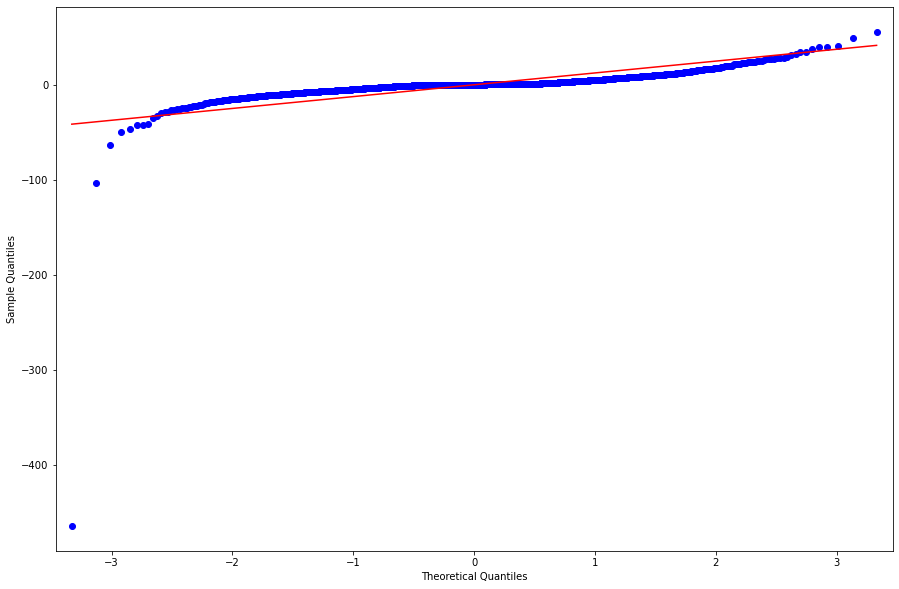

In [140]:
# Q-Q plot of the quantiles of x versus the quantiles/ppf of a distribution.
# Call qqplot() for arima_obj_fit
x = sm.qqplot(arima_VWS.resid, line = 's')

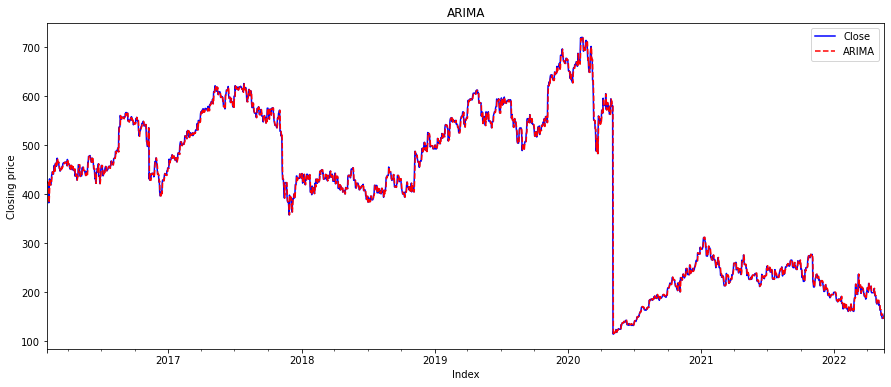

In [141]:
Plo.plot_models(VWS['Close'], VWS['ARIMA'], 'ARIMA')

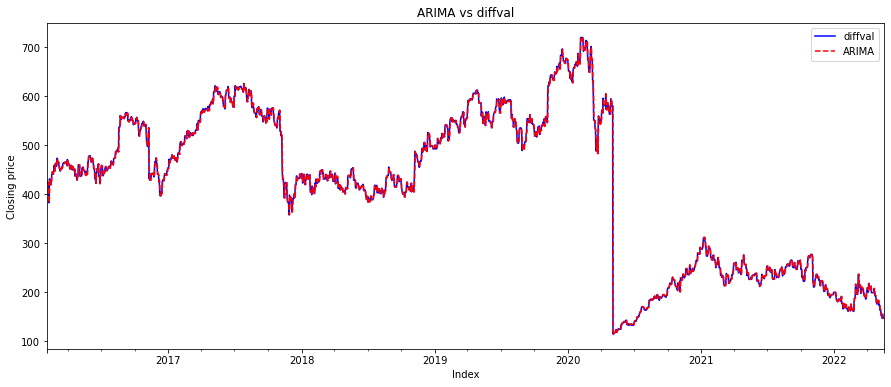

In [142]:
Plo.plot_models(VWS['diffval'], VWS['ARIMA'], 'ARIMA vs diffval')

Text(0, 0.5, 'Forecasted value')

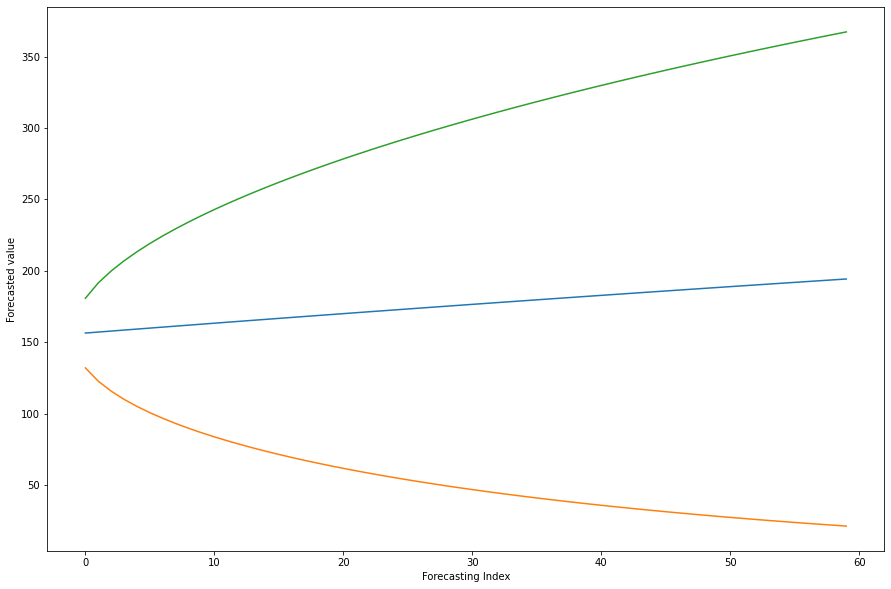

In [143]:
f, err, ci = arima_VWS.forecast(60)
plt.plot(f)
plt.plot(ci)
plt.xlabel('Forecasting Index')
plt.ylabel('Forecasted value')
# The forecasting estimates and confidence interval obtained using the preceding script is shown in Figure

##### Validating the Forecast

In [144]:
start = len(train_B)
end   = len(train_B) + len(test_B) - 1
predictions = arima_VWS.predict(start = start, end = end, dynamic = False, typ = 'levels')

In [145]:
# Create a dataframe to store r2 score
R_arima_VWS = pd.DataFrame({'r2_score': r2_score(test_B['Close'], predictions)}, index = [0])

# Add columns in the dataframe 'evaluation_results'
R_arima_VWS['Model'] = 'ARIMA'
R_arima_VWS.set_index(['Model'], inplace=True)
R_arima_VWS['mean_absolute_error'] = mean_absolute_error(test_B['Close'], predictions)
R_arima_VWS['mean_squared_error'] = mean_squared_error(test_B['Close'], predictions)
R_arima_VWS['root_mean_squared_error'] = np.sqrt(mean_squared_error(test_B['Close'], predictions))
R_arima_VWS['mean_absolute_percentage_error'] = np.mean(np.abs(predictions - test_B['Close'])
                                                               /np.abs(test_B['Close']))*100 
# Display the results
R_arima_VWS

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
ARIMA,0.38533,20.181786,620.703132,24.913914,9.656685


### III.4.-SARIMA

#### A.- EDP Renováveis (0ML1.IL) 

In [146]:
# order = (2, 1, 2) means 
# First 2 for auto regressive model, 1 for difference, and second 2 for moving average
# 12 additional parameter means number of observations per year or the period
SARIMAX_EDPR = SARIMAX(EDPR['Close'], order = (2, 0, 2), seasonal_order = (2, 1, 0, 12)).fit()
#AutoSarima=3, 0, 2 **  2, 1, 0, 12 ***0.88 Score
#by hand=2, 0, 2 **  2, 0, 1, 12 *** 0.91 Score
# Display the summary of the model
print(SARIMAX_EDPR.summary())


                                      SARIMAX Results                                      
Dep. Variable:                               Close   No. Observations:                 2327
Model:             SARIMAX(2, 0, 2)x(2, 1, [], 12)   Log Likelihood                -181.288
Date:                             Thu, 19 May 2022   AIC                            376.577
Time:                                     21:03:07   BIC                            416.807
Sample:                                 01-04-2016   HQIC                           391.239
                                      - 05-18-2022                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2854      0.818      0.349      0.727      -1.319       1.889
ar.L2          0.6533      

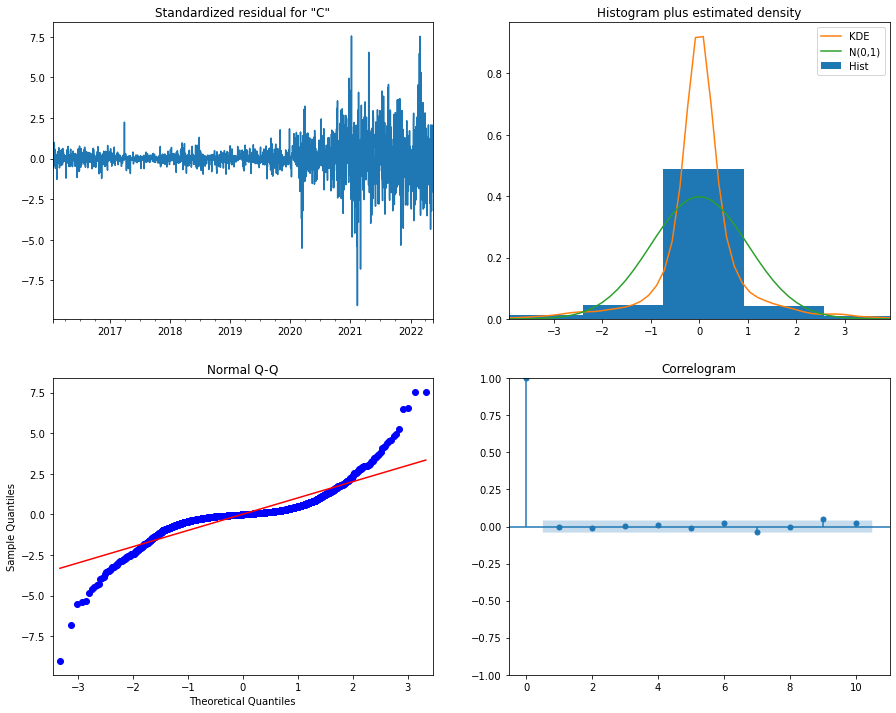

In [147]:
# Diagnosing the model residuals
SARIMAX_EDPR.plot_diagnostics(figsize = (15, 12))
plt.show()

##### Validating the Forecast

In [148]:
start = len(train_A)
end   = len(train_A) + len(test_A) - 1
predictions = SARIMAX_EDPR.predict(start = start, end = end, dynamic = False, typ = 'levels').rename('SARIMA Predictions')
print(predictions)

2021-06-03    18.495583
2021-06-04    17.959474
2021-06-05    18.335715
2021-06-06    18.767142
2021-06-07    18.669324
                ...    
2022-05-14    20.401249
2022-05-15    19.965381
2022-05-16    20.278235
2022-05-17    20.213696
2022-05-18    20.934756
Freq: D, Name: SARIMA Predictions, Length: 350, dtype: float64


In [149]:
# Create a dataframe to store r2 score
R_SARIMAX_EDPR = pd.DataFrame({'r2_score': r2_score(test_A['Close'], predictions)}, index = [0])

# Add columns in the dataframe 'evaluation_results'
R_SARIMAX_EDPR['Model'] = 'SARIMAX'
R_SARIMAX_EDPR.set_index(['Model'], inplace=True)
R_SARIMAX_EDPR['mean_absolute_error'] = mean_absolute_error(test_A['Close'], predictions)
R_SARIMAX_EDPR['mean_squared_error'] = mean_squared_error(test_A['Close'], predictions)
R_SARIMAX_EDPR['root_mean_squared_error'] = np.sqrt(mean_squared_error(test_A['Close'], predictions))
R_SARIMAX_EDPR['mean_absolute_percentage_error'] = np.mean(np.abs(predictions - test_A['Close'])
                                                               /np.abs(test_A['Close']))*100 
# Display the results
R_SARIMAX_EDPR

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
SARIMAX,0.926538,0.334291,0.200389,0.447648,1.588741


#### B.- Vestas Wind Systems A/S (0NMK.IL)

In [150]:
# 12 additional parameter means number of observations per year or the period
SARIMAX_VWS = SARIMAX(VWS['Close'], order = (0, 0,3),seasonal_order = (0, 1, 2, 12)).fit()#(AR,D,MA)#(p,d,q)
#AutoSarima=1, 0, 0 **  2, 1, 0, 12 ***	0.052546 Score
#by hand=0, 0, 3 **  0, 1, 2, 12 *** 0.34 Score
# Display the summary of the model
print(SARIMAX_VWS.summary())

                                        SARIMAX Results                                        
Dep. Variable:                                   Close   No. Observations:                 2297
Model:             SARIMAX(0, 0, 3)x(0, 1, [1, 2], 12)   Log Likelihood               -9998.083
Date:                                 Thu, 19 May 2022   AIC                          20008.167
Time:                                         21:03:19   BIC                          20042.572
Sample:                                     02-03-2016   HQIC                         20020.715
                                          - 05-18-2022                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          1.1111      0.006    197.612      0.000       1.100       1

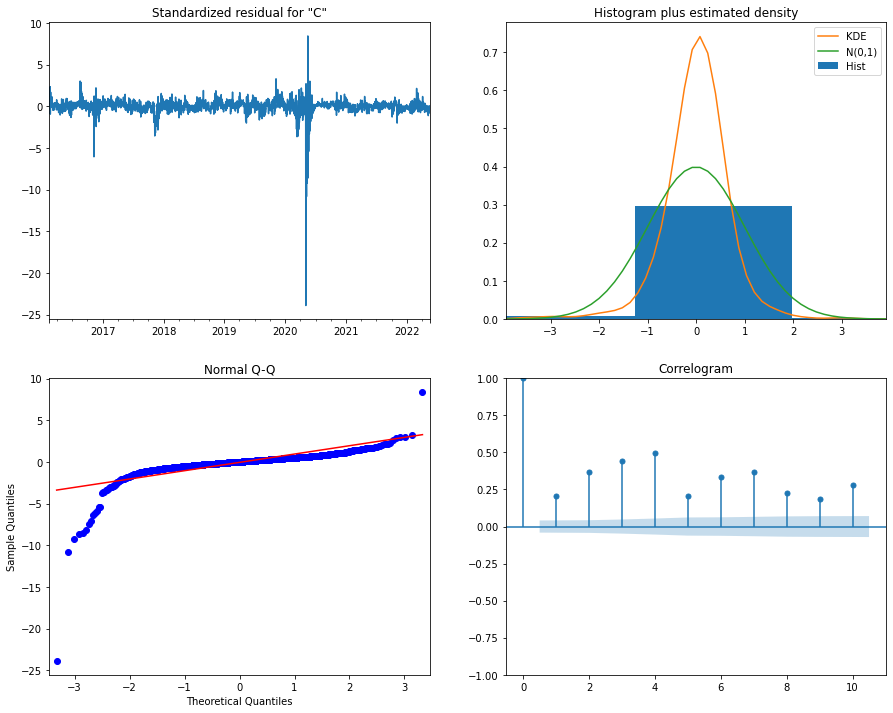

In [151]:
# Diagnosing the model residuals
SARIMAX_VWS.plot_diagnostics(figsize = (15, 12))
plt.show()

##### Validating the Forecast

In [152]:
start = len(train_B)
end   = len(train_B) + len(test_B) - 1
predictions = SARIMAX_VWS.predict(start = start, end = end, dynamic = False, typ = 'levels').rename('SARIMA Predictions')
print(predictions)

2021-07-03    234.165597
2021-07-04    244.804621
2021-07-05    236.589860
2021-07-06    246.715061
2021-07-07    240.672513
                 ...    
2022-06-13    171.337831
2022-06-14    167.242522
2022-06-15    165.036767
2022-06-16    169.026324
2022-06-17    163.701402
Freq: D, Name: SARIMA Predictions, Length: 350, dtype: float64


https://stats.stackexchange.com/questions/299712/what-are-the-shortcomings-of-the-mean-absolute-percentage-error-mape

In [153]:
# Create a dataframe to store r2 score
R_SARIMAX_VWS= pd.DataFrame({'r2_score': r2_score(test_B['Close'], predictions)}, index = [0])

# Add columns in the dataframe 'evaluation_results'
R_SARIMAX_VWS['Model'] = 'SARIMAX'
R_SARIMAX_VWS.set_index(['Model'], inplace=True)
R_SARIMAX_VWS['mean_absolute_error'] = mean_absolute_error(test_B['Close'], predictions)
R_SARIMAX_VWS['mean_squared_error'] = mean_squared_error(test_B['Close'], predictions)
R_SARIMAX_VWS['root_mean_squared_error'] = np.sqrt(mean_squared_error(test_B['Close'], predictions))
R_SARIMAX_VWS['mean_absolute_percentage_error'] = np.mean(np.abs(predictions - test_B['Close'])
                                                               /np.abs(test_B['Close']))*100
# Display the results
R_SARIMAX_VWS

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
SARIMAX,0.513076,17.447812,491.703319,22.174384,3.27554


### III.5.- PY TORCH

In [125]:
import torch
from torch import nn, optim
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error
import numpy as np

#### A.- EDP Renováveis (0ML1.IL) 

In [126]:
 # We will be using the dataset from the beginning of this notebook with only the columns Date and Close, which are the columns that we need to do this experiment
 base_EDPR = pd.read_csv('EDPR_df.csv')

In [127]:
#Here we can verify that our dataset has only two columns and it has all data from 01/01/2016 to today.
base_EDPR.shape

(1612, 2)

In [128]:
base_EDPR = base_EDPR.dropna()

In [129]:
# In this part of the code, we will split the data into training and test. For this we will use all the data prior to the last 30 days for training and we will use the last 30 days to test it.
EDPR_training_base = base_EDPR.iloc[:-30 , :]
EDPR_test_base = base_EDPR.tail(30)
EDPR_training_base.shape, EDPR_test_base.shape

((1582, 2), (30, 2))

In [130]:
# We can check here that the training dataset uses the first 1582 days(Only weekdays)
EDPR_training_base.tail()

,Date,Close
1577,2022-03-28,22.690001
1578,2022-03-29,22.299999
1579,2022-03-30,23.080000
1580,2022-03-31,23.270000
1581,2022-04-01,23.385000


In [131]:
# And here we can see that the test dataset starts exactly one day after the last day on the training dataset
EDPR_test_base.head()

,Date,Close
1582,2022-04-04,23.459999
1583,2022-04-05,24.545000
1584,2022-04-06,23.965000
1585,2022-04-07,24.010000
1586,2022-04-08,23.485001


In [132]:
#We are going to get only the values for the column we wanto to work with.
EDPR_training_base_nn = EDPR_training_base.iloc[:, 1:2].values

In [133]:
EDPR_training_base_nn 

array([[ 7.13509989],
       [ 7.30060005],
       [ 7.21512985],
       ...,
       [23.07999992],
       [23.27000046],
       [23.38500023]])

In [134]:
# Here we will normalize the data since we are working with a neural network, it is best if the values are on the same scale.
normalizer = MinMaxScaler(feature_range=(0,1))
EDPR_training_base_normalized = normalizer.fit_transform(EDPR_training_base_nn)

In [135]:
#This is the training base normalized
EDPR_training_base_normalized

array([[0.07334285],
       [0.08151565],
       [0.07729492],
       ...,
       [0.86074144],
       [0.87012414],
       [0.87580311]])

In [136]:
#The idea to train this model is to use the first 90 values to predict the next price and so on. So to each price we will predict we will use the last 90 values.
X = []
y = []
for i in range(90, len(EDPR_training_base_normalized)):
  X.append(EDPR_training_base_normalized[i-90:i, 0])
  y.append(EDPR_training_base_normalized[i, 0])# This will always be the next value after the 90th value.
X, y = np.array(X), np.array(y)

In [137]:
#First 90 predictive registers to get the next price
X[0]

array([0.07334285, 0.08151565, 0.07729492, 0.07751073, 0.07637493,
       0.06780706, 0.07244903, 0.07960949, 0.07247371, 0.06148612,
       0.05970836, 0.05318988, 0.04430497, 0.04457261, 0.05862193,
       0.06030093, 0.07007866, 0.07314038, 0.07394778, 0.07400457,
       0.07620209, 0.06894287, 0.06749351, 0.05896761, 0.05733799,
       0.04681953, 0.04291831, 0.04953555, 0.03220231, 0.0300211 ,
       0.03737019, 0.03803684, 0.03654057, 0.03931339, 0.03706648,
       0.03711588, 0.03950104, 0.03924673, 0.0370418 , 0.04207979,
       0.04790593, 0.04889358, 0.04701459, 0.04708126, 0.04594545,
       0.04003437, 0.0397356 , 0.03778748, 0.03784672, 0.04284918,
       0.0453504 , 0.04307387, 0.03663191, 0.04123931, 0.04467631,
       0.04667631, 0.05389109, 0.05309604, 0.05343677, 0.05343677,
       0.05343677, 0.05343677, 0.05343677, 0.05343677, 0.05343677,
       0.05343677, 0.0379529 , 0.0379529 , 0.04143683, 0.03610353,
       0.04323189, 0.04326399, 0.04317262, 0.04545411, 0.05065

In [138]:
#First price after the 90 before
y[0]

0.052120729299653

In [139]:
# We need to convert the data to the pytorch format
X = torch.tensor(X, dtype=torch.float32)
y = torch.tensor(y, dtype=torch.float32)

In [140]:
#We are going to use this to train the model
dataset_EDPR = torch.utils.data.TensorDataset(X, y)
loader_EDPR = torch.utils.data.DataLoader(dataset_EDPR, batch_size=32, shuffle=True)

### Building the Recurrent Neural Network (LSTM)

In [141]:

class regressor_LSTM_EDPR(nn.Module):
  def __init__(self): #constructor method
    super().__init__()

    self.lstm1_EDPR = nn.LSTM(input_size=1, hidden_size=100) #First layer of the network
    self.lstm2_EDPR = nn.LSTM(100, 50)
    self.lstm3_EDPR = nn.LSTM(50, 50, dropout = 0.3, num_layers=2)
    self.dropout_EDPR = nn.Dropout(p = 0.3)
    self.linear_EDPR = nn.Linear(in_features=50, out_features=1)

  def forward(self, X):
    # (batch_size, timesteps = 90 in this case) -> (timesteps, batch_size, dimensions)
    X = X.permute(1, 0).unsqueeze(2)
    X, _ = self.lstm1_EDPR(X)
    X = self.dropout_EDPR(X)
    X, _ = self.lstm2_EDPR(X)
    X = self.dropout_EDPR(X)
    X, _ = self.lstm3_EDPR(X)

    X = X[-1]
    X = self.dropout_EDPR(X)
    X = self.linear_EDPR(X)

    return X

In [142]:
# We do this to access the gpu 
device_pc = torch.device('cuda') if torch.cuda.is_available else torch.device('cpu')
device_pc

device(type='cuda')

In [143]:
#Here will create the regressor for the LSTM, our accuracy criterion is MSE.
regressor_EDPR = regressor_LSTM_EDPR()
criterion = nn.MSELoss()

optimizer_EDPR = optim.RMSprop(regressor_EDPR.parameters(), lr = 1e-3, alpha = 0.9)

In [144]:
regressor_EDPR.to(device_pc)

regressor_LSTM_EDPR(
  (lstm1_EDPR): LSTM(1, 100)
  (lstm2_EDPR): LSTM(100, 50)
  (lstm3_EDPR): LSTM(50, 50, num_layers=2, dropout=0.3)
  (dropout_EDPR): Dropout(p=0.3, inplace=False)
  (linear_EDPR): Linear(in_features=50, out_features=1, bias=True)
)

## TRAINING THE MODEL

In [145]:
#With this piece of code we will do the training of the model
for epoch in range (100): #100 epochs of training
  running_loss_EDPR = 0.
  running_mae_EDPR = 0.

  for i, data in enumerate(loader_EDPR):
    inputs, labels = data 
    inputs, labels = inputs.to(device_pc), labels.to(device_pc)

    optimizer_EDPR.zero_grad()

    outputs = regressor_EDPR(inputs)
    outputs = outputs.flatten()

    loss = criterion(outputs, labels)
    loss.backward()

    optimizer_EDPR.step()

    running_loss_EDPR += loss.item()

    mae = mean_absolute_error(labels.detach().cpu().numpy().flatten(),
                              outputs.detach().cpu().numpy().flatten())
    running_mae_EDPR +=mae
    #Printing the data regarding this loop
    print('\rEpoch {:3d} - Loop {:3d} of {:3d}: cost {:03.5f} - MAE {:03.5f}'.format(epoch+1, i+1, len(loader_EDPR), loss, mae), end = '\r')

#Printing the data regarding this epoch
running_loss_EDPR /= len(loader_EDPR)
running_mae_EDPR /= len(loader_EDPR)
print('\rEpoch {:3d} Finished: cost {:03.6f} - MAE {:03.6f}'.format(epoch+1, running_loss_EDPR, running_mae_EDPR))

Epoch 100 Finished: cost 0.001454 - MAE 0.027050


## Evaluating the model

In [146]:
EDPR_test_base.head()

,Date,Close
1582,2022-04-04,23.459999
1583,2022-04-05,24.545000
1584,2022-04-06,23.965000
1585,2022-04-07,24.010000
1586,2022-04-08,23.485001


In [147]:
EDPR_test_base.shape

(30, 2)

In [148]:
real_price = EDPR_test_base.iloc[:, 1:2].values

In [149]:
real_price

array([[23.45999908],
       [24.54500008],
       [23.96500015],
       [24.01000023],
       [23.48500061],
       [22.96999931],
       [22.65999985],
       [22.84000015],
       [23.17000008],
       [22.68499947],
       [23.06500053],
       [22.86000061],
       [22.68000031],
       [22.99500084],
       [22.75      ],
       [22.61499977],
       [22.83499908],
       [22.52000046],
       [21.41500092],
       [21.12999916],
       [20.62999916],
       [21.19000053],
       [20.35750008],
       [20.78499985],
       [20.76000023],
       [20.12000084],
       [20.33749962],
       [20.47999954],
       [20.75499916],
       [20.63999939]])

In [150]:
complete_base_EDPR = pd.concat((EDPR_training_base['Close'], EDPR_test_base['Close']), axis = 0 )

In [151]:
complete_base_EDPR.shape

(1612,)

In [152]:
entries_EDPR = complete_base_EDPR[len(complete_base_EDPR)-len(EDPR_test_base)-90:].values

In [153]:
entries_EDPR

array([21.80999947, 22.60000038, 22.54000092, 22.70000076, 22.57999992,
       22.36000061, 21.79999924, 21.34000015, 21.56999969, 22.27000046,
       22.04999924, 22.18000031, 21.73999977, 21.71999931, 20.92000008,
       21.05999947, 21.42000008, 21.34000015, 21.37000084, 21.54000092,
       21.48999977, 21.95999908, 21.70999908, 21.69000053, 21.76000023,
       21.79999924, 21.61000061, 20.84000015, 19.95499992, 19.53499985,
       19.44000053, 19.55999947, 19.98500061, 19.77000046, 19.39999962,
       19.32500076, 18.95499992, 19.18000031, 20.04000092, 19.22999954,
       18.61499977, 18.15999985, 18.62000084, 18.62000084, 18.04999924,
       18.45000076, 18.78499985, 19.06500053, 18.43000031, 18.04999924,
       18.18000031, 17.87999916, 18.32999992, 17.79000092, 17.19000053,
       16.80500031, 17.79999924, 17.93499947, 18.61499977, 18.44499969,
       17.96500015, 17.73999977, 17.95999908, 19.88500023, 19.93499947,
       21.78000069, 21.42000008, 21.23999977, 20.40500069, 20.55

In [154]:
entries_EDPR.shape

(120,)

In [155]:
entries_EDPR = entries_EDPR.reshape(-1,1)
entries_EDPR.shape

(120, 1)

In [156]:
entries_EDPR= normalizer.transform(entries_EDPR)
entries_EDPR

array([[0.79802568],
       [0.83703788],
       [0.83407495],
       [0.84197614],
       [0.8360502 ],
       [0.82518609],
       [0.79753184],
       [0.77481595],
       [0.7861739 ],
       [0.82074166],
       [0.80987746],
       [0.81629723],
       [0.79456892],
       [0.79358125],
       [0.75407531],
       [0.76098882],
       [0.77876654],
       [0.77481595],
       [0.77629746],
       [0.78469248],
       [0.7822233 ],
       [0.80543303],
       [0.79308741],
       [0.79209983],
       [0.79555659],
       [0.79753184],
       [0.78814924],
       [0.75012471],
       [0.70642121],
       [0.68568057],
       [0.68098927],
       [0.68691511],
       [0.70790272],
       [0.69728548],
       [0.67901393],
       [0.6753103 ],
       [0.65703874],
       [0.66814982],
       [0.71061877],
       [0.6706189 ],
       [0.64024869],
       [0.61777967],
       [0.64049566],
       [0.64049566],
       [0.61234757],
       [0.63210063],
       [0.64864372],
       [0.662

In [157]:
X_test = []
for i in range(90, 120):
  X_test.append(entries_EDPR[i-90:i,0])
X_test = np.array(X_test)  

In [158]:
X_test[29]

array([0.68568057, 0.68098927, 0.68691511, 0.70790272, 0.69728548,
       0.67901393, 0.6753103 , 0.65703874, 0.66814982, 0.71061877,
       0.6706189 , 0.64024869, 0.61777967, 0.64049566, 0.64049566,
       0.61234757, 0.63210063, 0.64864372, 0.66247084, 0.63111296,
       0.61234757, 0.61876734, 0.60395254, 0.62617469, 0.59950821,
       0.56987871, 0.55086644, 0.60000195, 0.60666859, 0.64024869,
       0.63185367, 0.6081501 , 0.59703903, 0.60790314, 0.70296445,
       0.70543354, 0.79654426, 0.77876654, 0.76987768, 0.72864336,
       0.73629759, 0.79506276, 0.84345756, 0.85975377, 0.82666751,
       0.84691431, 0.80197627, 0.80691454, 0.79901335, 0.81530956,
       0.84296372, 0.82469226, 0.83407495, 0.81530956, 0.82222308,
       0.82765518, 0.84148231, 0.82222308, 0.86074144, 0.87012414,
       0.87580311, 0.87950674, 0.93308677, 0.90444494, 0.90666716,
       0.88074138, 0.85530934, 0.8400008 , 0.84888966, 0.86518587,
       0.84123534, 0.86000073, 0.84987733, 0.84098847, 0.85654

## FORECAST

In [159]:
X_test = torch.tensor(X_test, device = device_pc, dtype = torch.float32)

In [160]:
regressor_EDPR.eval()
forecast_EDPR = regressor_EDPR.forward(X_test)

In [161]:
forecast_EDPR

tensor([[0.9200],
        [0.9226],
        [0.9385],
        [0.9392],
        [0.9394],
        [0.9358],
        [0.9304],
        [0.9247],
        [0.9234],
        [0.9245],
        [0.9161],
        [0.9136],
        [0.9092],
        [0.9025],
        [0.9014],
        [0.8965],
        [0.8896],
        [0.8885],
        [0.8834],
        [0.8591],
        [0.8372],
        [0.8189],
        [0.8212],
        [0.8036],
        [0.7952],
        [0.7946],
        [0.7792],
        [0.7731],
        [0.7787],
        [0.7900]], device='cuda:0', grad_fn=<AddmmBackward0>)

In [162]:
forecast_EDPR.shape

torch.Size([30, 1])

In [163]:
forecast_EDPR = forecast_EDPR.detach().cpu().numpy().reshape(-1,1)

In [164]:
forecast_EDPR.shape

(30, 1)

In [165]:
forecast_EDPR = normalizer.inverse_transform(forecast_EDPR)

In [166]:
forecast_EDPR.mean()

23.3688

In [167]:
real_price.mean()

22.15699996948242

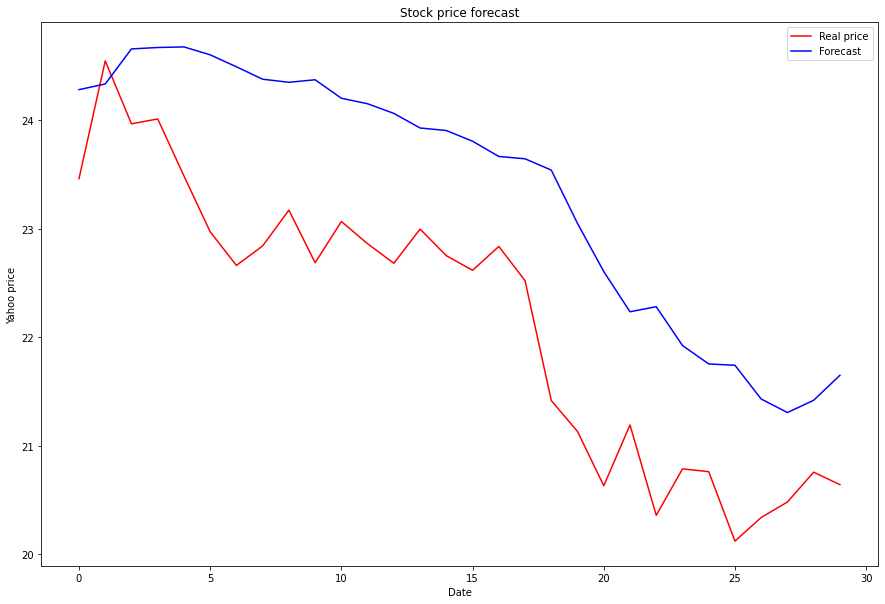

In [169]:
plt.plot(real_price, color= 'red', label= 'Real price')
plt.plot(forecast_EDPR, color = 'blue', label = 'Forecast')
plt.title('Stock price forecast')
plt.xlabel('Date')
plt.ylabel('Yahoo price')
plt.legend()


In [181]:
# Create a dataframe to store r2 score
NEURAL_NET= pd.DataFrame({'r2_score': r2_score(real_price, forecast_EDPR)}, index = [0])

# Add columns in the dataframe 'evaluation_results'
NEURAL_NET['Model'] = 'NEURAL_NET'
NEURAL_NET.set_index(['Model'], inplace=True)
NEURAL_NET['mean_absolute_error'] = mean_absolute_error(real_price, forecast_EDPR)
NEURAL_NET['mean_squared_error'] = mean_squared_error(real_price, forecast_EDPR)
NEURAL_NET['root_mean_squared_error'] = np.sqrt(mean_squared_error(real_price, forecast_EDPR))
NEURAL_NET['mean_absolute_percentage_error'] = np.mean(np.abs(forecast_EDPR - real_price)
                                                               /np.abs(real_price))*100
# Display the results
NEURAL_NET

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
NEURAL_NET,-0.055072,1.225973,1.705089,1.30579,5.593578


#### B.- Vestas Wind Systems A/S (VWS.CO)

### III.6.-Facebook Prophet

#### A.- EDP Renováveis (0ML1.IL) 

In [154]:
dataset_EDPR = pd.read_csv('EDPR_df.csv')
dataset_EDPR.head()

,Date,Close
0,2016-01-04,7.13510
1,2016-01-05,7.30060
2,2016-01-06,7.21513
3,2016-01-07,7.21950
4,2016-01-08,7.19650


In [155]:
dataset_EDPR = dataset_EDPR[['Date', 'Close']].rename(columns = {'Date': 'ds', 'Close': 'y'})
dataset_EDPR.head()

,ds,y
0,2016-01-04,7.13510
1,2016-01-05,7.30060
2,2016-01-06,7.21513
3,2016-01-07,7.21950
4,2016-01-08,7.19650


In [156]:
dataset_EDPR.tail()

,ds,y
1607,2022-05-12,20.120001
1608,2022-05-13,20.337500
1609,2022-05-16,20.480000
1610,2022-05-17,20.754999
1611,2022-05-18,20.639999


In [157]:
dataset_EDPR.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1612 entries, 0 to 1611
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ds      1612 non-null   object 
 1   y       1612 non-null   float64
dtypes: float64(1), object(1)
memory usage: 25.3+ KB


In [158]:
dataset_EDPR.shape

(1612, 2)

In [159]:
#Split into train / test 

train_EDPR = dataset_EDPR.iloc[:-60 , :]
test_EDPR = dataset_EDPR.tail(60)


In [160]:
train_EDPR.tail()

,ds,y
1547,2022-02-14,16.805000
1548,2022-02-15,17.799999
1549,2022-02-16,17.934999
1550,2022-02-17,18.615000
1551,2022-02-18,18.445000


In [161]:
test_EDPR.head()

,ds,y
1552,2022-02-21,17.965000
1553,2022-02-22,17.740000
1554,2022-02-23,17.959999
1555,2022-02-24,19.885000
1556,2022-02-25,19.934999


In [162]:
test_EDPR.tail(3)

,ds,y
1609,2022-05-16,20.480000
1610,2022-05-17,20.754999
1611,2022-05-18,20.639999


In [163]:
test_EDPR.shape, train_EDPR.shape

((60, 2), (1552, 2))

In [164]:
model = Prophet()
model.fit(train_EDPR)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [165]:
future_EDPR = model.make_future_dataframe(periods=60, freq='d', include_history = True ) # With this line of code the model will make predictions for the next 60 days

In [166]:
preds_train_EDPR = model.predict(future_EDPR)

In [167]:
preds_train_EDPR.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
1607,2022-04-15,21.823882,20.487475,23.166142,21.756272,21.918792,-0.015680,-0.015680,-0.015680,-0.053379,-0.053379,-0.053379,0.037699,0.037699,0.037699,0.0,0.0,0.0,21.808202
1608,2022-04-16,21.829701,20.625763,23.295462,21.759135,21.926883,0.123247,0.123247,0.123247,0.062822,0.062822,0.062822,0.060425,0.060425,0.060425,0.0,0.0,0.0,21.952948
1609,2022-04-17,21.835520,20.702961,23.306409,21.762294,21.936407,0.141887,0.141887,0.141887,0.062822,0.062822,0.062822,0.079065,0.079065,0.079065,0.0,0.0,0.0,21.977407
1610,2022-04-18,21.841339,20.606563,23.135244,21.765660,21.947182,0.060541,0.060541,0.060541,-0.032914,-0.032914,-0.032914,0.093455,0.093455,0.093455,0.0,0.0,0.0,21.901880
1611,2022-04-19,21.847158,20.554999,23.219054,21.768848,21.956023,0.089419,0.089419,0.089419,-0.014086,-0.014086,-0.014086,0.103505,0.103505,0.103505,0.0,0.0,0.0,21.936577


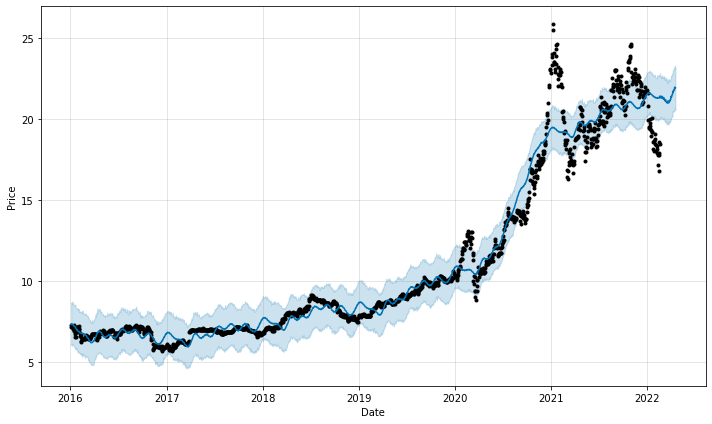

In [168]:
model.plot(preds_train_EDPR, xlabel = 'Date', ylabel = 'Price');

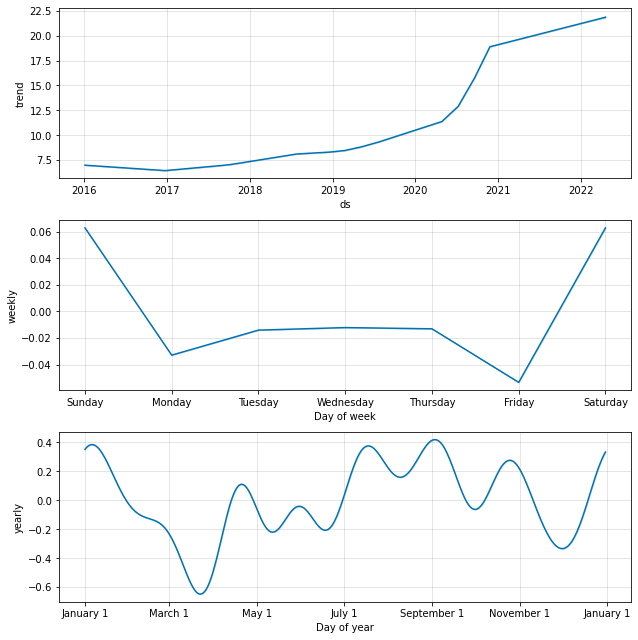

In [169]:
model.plot_components(preds_train_EDPR);#shows the trend over the years, over one year and weekly 

In [170]:
plot_components_plotly(model, preds_train_EDPR)#shows the trend over the years, over one year and weekly 

In [171]:
plot_plotly(model, preds_train_EDPR)

##### Validating the Forecast

In [172]:
# Create a dataframe to store r2 score
PROPHET= pd.DataFrame({'r2_score': r2_score(dataset_EDPR['y'], preds_train_EDPR['yhat'])}, index = [0])

# Add columns in the dataframe 'evaluation_results'
PROPHET['Model'] = 'PROPHET'
PROPHET.set_index(['Model'], inplace=True)
PROPHET['mean_absolute_error'] = mean_absolute_error(dataset_EDPR['y'], preds_train_EDPR['yhat'])
PROPHET['mean_squared_error'] = mean_squared_error(dataset_EDPR['y'], preds_train_EDPR['yhat'])
PROPHET['root_mean_squared_error'] = np.sqrt(mean_squared_error(dataset_EDPR['y'], preds_train_EDPR['yhat']))
PROPHET['mean_absolute_percentage_error'] = np.mean(np.abs(preds_train_EDPR['yhat'] - dataset_EDPR['y'])
                                                               /np.abs(dataset_EDPR['y']))*100
# Display the results
PROPHET

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
PROPHET,0.964922,0.665326,1.104112,1.050767,5.263635


In [173]:
from fbprophet.diagnostics import cross_validation
# Apply cross-validation on our model. This creates a forecast, for 132 days ahead (only week days), every 66 days, with 3 years of initial training data.
# As we have 6.5 years of data, this results in 21 forecasts (1 every quarter of a year, starting from 3 years -> 6 years).
crossv_EDPR = cross_validation( model, initial = '768 days', period = '66 days', horizon = '132 days' )

INFO:fbprophet:Making 21 forecasts with cutoffs between 2018-02-27 00:00:00 and 2021-10-09 00:00:00


  0%|          | 0/21 [00:00<?, ?it/s]

In [174]:
perf_EDPR = performance_metrics(crossv_EDPR )
perf_EDPR.tail()

,horizon,mse,rmse,mae,mape,mdape,coverage
114,128 days,11.357540,3.370095,2.295676,0.142171,0.111669,0.213542
115,129 days,11.773968,3.431322,2.328695,0.143404,0.112730,0.212847
116,130 days,11.977537,3.460858,2.365004,0.145908,0.117297,0.217708
117,131 days,11.641909,3.412024,2.346603,0.145130,0.120360,0.222222
118,132 days,11.895961,3.449052,2.361573,0.144937,0.118063,0.232986


In [175]:
# Evaluate the mean MAPE for our forecasts.
crossv_mape_EDPR = round( 100 * perf_EDPR['mape'].mean(), 2 )
print( f'Cross validation MAPE: %' , crossv_mape_EDPR)

Cross validation MAPE: % 10.43


#### B.- Vestas Wind Systems A/S (0NMK.IL)

In [176]:
dataset_VWS = pd.read_csv('VWS_df.csv')
dataset_VWS.head()

,Date,Close
0,2016-01-04,475.468903
1,2016-01-05,475.200012
2,2016-01-06,468.399994
3,2016-01-07,460.307312
4,2016-01-08,458.308014


In [177]:
dataset_VWS = dataset_VWS[['Date', 'Close']].rename(columns = {'Date': 'ds', 'Close': 'y'})
dataset_VWS.head()

,ds,y
0,2016-01-04,475.468903
1,2016-01-05,475.200012
2,2016-01-06,468.399994
3,2016-01-07,460.307312
4,2016-01-08,458.308014


In [178]:
dataset_VWS.tail()

,ds,y
1607,2022-05-12,147.080002
1608,2022-05-13,147.080002
1609,2022-05-16,149.149994
1610,2022-05-17,151.960007
1611,2022-05-18,155.850006


In [179]:
dataset_VWS.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1612 entries, 0 to 1611
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ds      1612 non-null   object 
 1   y       1612 non-null   float64
dtypes: float64(1), object(1)
memory usage: 25.3+ KB


In [180]:
dataset_VWS.shape

(1612, 2)

In [181]:
#Split into train / test 

train_VWS = dataset_VWS.iloc[:-60 , :]
test_VWS = dataset_VWS.tail(60)

In [182]:
train_VWS.tail()

,ds,y
1547,2022-02-14,162.25
1548,2022-02-15,175.75
1549,2022-02-16,171.75
1550,2022-02-17,171.50
1551,2022-02-18,165.50


In [183]:
test_VWS.head()

,ds,y
1552,2022-02-21,162.25
1553,2022-02-22,165.00
1554,2022-02-23,161.25
1555,2022-02-24,181.25
1556,2022-02-25,188.75


In [184]:
test_VWS.tail(3)

,ds,y
1609,2022-05-16,149.149994
1610,2022-05-17,151.960007
1611,2022-05-18,155.850006


In [185]:
test_VWS.shape, train_VWS.shape

((60, 2), (1552, 2))

In [186]:
model = Prophet()
model.fit(train_VWS)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [187]:
future_VWS = model.make_future_dataframe(periods=60, freq='d', include_history = True ) # With this line of code the model will make predictions for the next 60 days

In [188]:
preds_train_VWS = model.predict(future_VWS)

In [189]:
preds_train_VWS.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
1607,2022-04-15,240.636396,221.003305,352.127282,233.598213,249.307286,45.011884,45.011884,45.011884,-7.414825,-7.414825,-7.414825,52.426709,52.426709,52.426709,0.0,0.0,0.0,285.648279
1608,2022-04-16,240.653423,245.312039,378.194555,233.282994,249.561431,71.768969,71.768969,71.768969,19.067448,19.067448,19.067448,52.701521,52.701521,52.701521,0.0,0.0,0.0,312.422392
1609,2022-04-17,240.670450,247.617270,380.727770,233.037199,249.799031,71.740983,71.740983,71.740983,19.067448,19.067448,19.067448,52.673535,52.673535,52.673535,0.0,0.0,0.0,312.411433
1610,2022-04-18,240.687478,217.270512,348.046158,232.651059,250.204091,43.925594,43.925594,43.925594,-8.404959,-8.404959,-8.404959,52.330553,52.330553,52.330553,0.0,0.0,0.0,284.613072
1611,2022-04-19,240.704505,217.172278,356.102590,232.244343,250.675969,44.781124,44.781124,44.781124,-6.883095,-6.883095,-6.883095,51.664219,51.664219,51.664219,0.0,0.0,0.0,285.485629


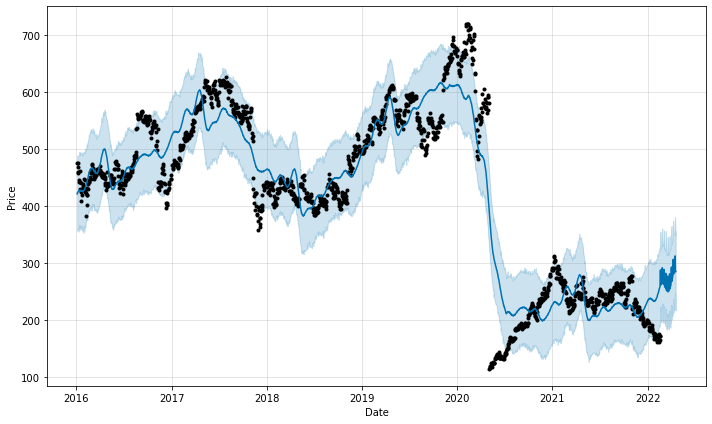

In [190]:
model.plot(preds_train_VWS, xlabel = 'Date', ylabel = 'Price');

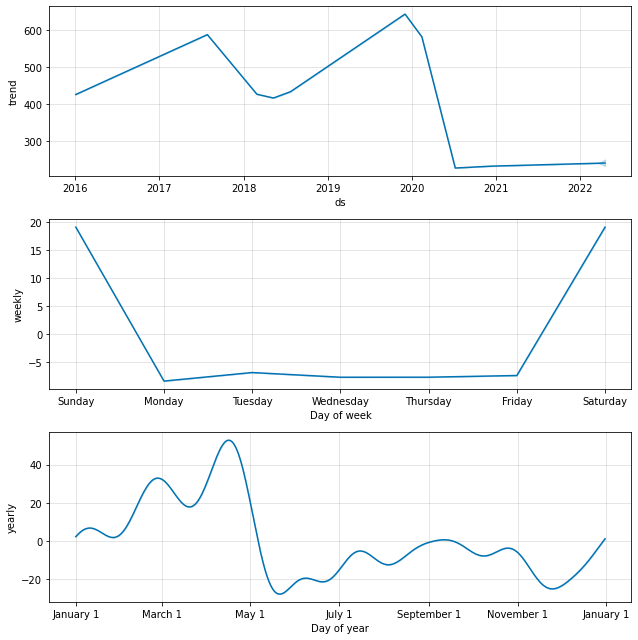

In [191]:
model.plot_components(preds_train_VWS);#shows the trend over the years, over one year and weekly 

In [192]:
plot_components_plotly(model, preds_train_VWS)#shows the trend over the years, over one year and weekly 

In [193]:
plot_plotly(model, preds_train_VWS)

##### Validating the Forecast

In [194]:
# Create a dataframe to store r2 score
PROPHET_VWS= pd.DataFrame({'r2_score': r2_score(dataset_VWS['y'], preds_train_VWS['yhat'])}, index = [0])

# Add columns in the dataframe 'evaluation_results'
PROPHET_VWS['Model'] = 'PROPHET_VWS'
PROPHET_VWS.set_index(['Model'], inplace=True)
PROPHET_VWS['mean_absolute_error'] = mean_absolute_error(dataset_VWS['y'], preds_train_VWS['yhat'])
PROPHET_VWS['mean_squared_error'] = mean_squared_error(dataset_VWS['y'], preds_train_VWS['yhat'])
PROPHET_VWS['root_mean_squared_error'] = np.sqrt(mean_squared_error(dataset_VWS['y'], preds_train_VWS['yhat']))
PROPHET_VWS['mean_absolute_percentage_error'] = np.mean(np.abs(preds_train_VWS['yhat'] - dataset_VWS['y'])
                                                               /np.abs(dataset_VWS['y']))*100
# Display the results
PROPHET_VWS

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
PROPHET_VWS,0.88218,40.648094,2838.492475,53.277504,13.473599


#### CROSSVALIDATION

In [195]:
from fbprophet.diagnostics import cross_validation
# Apply cross-validation on our model. This creates a forecast, for 132 days ahead (only week days), every 66 days, with 3 years of initial training data.
# As we have 6.5 years of data, this results in 21 forecasts (1 every quarter of a year, starting from 3 years -> 6 years).
crossv_VWS = cross_validation( model, initial = '768 days', period = '66 days', horizon = '132 days' )

INFO:fbprophet:Making 21 forecasts with cutoffs between 2018-02-27 00:00:00 and 2021-10-09 00:00:00


  0%|          | 0/21 [00:00<?, ?it/s]

In [196]:
perf_VWS = performance_metrics(crossv_VWS )
perf_VWS.tail()

,horizon,mse,rmse,mae,mape,mdape,coverage
114,128 days,58973.022947,242.843618,200.136922,0.782910,0.404087,0.151042
115,129 days,58856.182623,242.602932,200.105428,0.778305,0.399461,0.150000
116,130 days,59104.265323,243.113688,201.842458,0.776966,0.394582,0.144792
117,131 days,60836.595356,246.650756,204.620085,0.798165,0.399461,0.150347
118,132 days,60374.808491,245.712858,203.531035,0.797836,0.399461,0.161111


In [197]:
# Evaluate the mean MAPE for our forecasts.
crossv_mape_VWS = round( 100 * perf_VWS['mape'].mean(), 2 )
print( f'Cross validation MAPE: %' , crossv_mape_VWS)

Cross validation MAPE: % 60.86


## Summary

In [198]:
Validation_EDPR= pd.concat([MA_SES_EDPR, MA_HoltWinters_EDPR,R_arma_EDPR,R_arima_EDPR,R_SARIMAX_EDPR,PROPHET])
Validation_EDPR

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
MA_SES,0.940094,0.261486,0.163412,0.404243,1.245338
MA_Holt-Winters,0.940835,0.263929,0.161390,0.401733,1.257424
ARMA,0.940089,0.262234,0.163425,0.404258,1.248786
ARIMA,0.940298,0.265659,0.162855,0.403553,1.264685
SARIMAX,0.926538,0.334291,0.200389,0.447648,1.588741
PROPHET,0.964922,0.665326,1.104112,1.050767,5.263635


In [199]:
Validation_VWS= pd.concat([MA_SES_VWS, MA_HoltWinters_VWS,R_arma_VWS,R_arima_VWS,R_SARIMAX_VWS,PROPHET_VWS])
Validation_VWS

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
MA_SES,0.956506,4.521095,43.921238,6.627310,2.113330
MA_Holt-Winters,0.956506,4.521095,43.921238,6.627310,2.113330
ARMA,0.385457,20.175411,620.574841,24.911340,9.650315
ARIMA,0.385330,20.181786,620.703132,24.913914,9.656685
SARIMAX,0.513076,17.447812,491.703319,22.174384,3.275540
PROPHET_VWS,0.882180,40.648094,2838.492475,53.277504,13.473599


## Complementary Reading

Reference: Efstathopoulos g. (2020) Python for Finance, Part I: Yahoo & Google Finance API, pandas, and matplotlib 
Available at: URL <a href="https://www.learndatasci.com/tutorials/python-finance-part-yahoo-finance-api-pandas-matplotlib/ ">https://www.learndatasci.com/tutorials/python-finance-part-yahoo-finance-api-pandas-matplotlib/ </a>(Accessed 14 October 2021).  

Reference: Witham, J. (2020) The Imperative For A 24/7 Renewable Energy World, Forbes. 
Available at: URL <a href="https://pandas-datareader.readthedocs.io/en/latest/remote_data.html#remote-data-yahoo">https://pandas-datareader.readthedocs.io/en/latest/remote_data.html#remote-data-yahoo/ </a>(Accessed 14 October 2021).  

Reference: Norris, E. (2021) "Why Did My Stock's Ticker Change?", Investopedia. 
Available at: URL <a href="https://www.investopedia.com/ask/answers/why-did-my-stocks-ticker-change/">https://www.investopedia.com/ask/answers/why-did-my-stocks-ticker-change/ </a>(Accessed 14 October 2021).  

Reference: Mahgoub, A. (2021) "Stock Prediction using Regression Algorithm in Python", Medium. 
Available at: URL <a href="https://medium.com/codex/stock-predication-using-regression-algorithm-in-python-fb8b426453b9/">https://medium.com/codex/stock-predication-using-regression-algorithm-in-python-fb8b426453b9</a>(Accessed 25 Feb 2022). 

Reference: Prabhakaran, S. (2019) "Augmented Dickey Fuller Test (ADF Test) – Must Read Guide", Medium. 
Available at: URL <a href="https://www.machinelearningplus.com/time-series/augmented-dickey-fuller-test/#:~:text=Augmented%20Dickey%20Fuller%20test%20(ADF%20Test)%20is%20a%20common%20statistical,the%20stationary%20of%20a%20series.">https://www.machinelearningplus.com/time-series/augmented-dickey-fuller-test/#:~:text=Augmented%20Dickey%20Fuller%20test%20(ADF%20Test)%20is%20a%20common%20statistical,the%20stationary%20of%20a%20series.</a>

Reference: Masum, M. (2020) "Time Series Analysis: Identifying AR and MA using ACF and PACF Plots", Medium. 
Available at: URL <a href="https://towardsdatascience.com/identifying-ar-and-ma-terms-using-acf-and-pacf-plots-in-time-series-forecasting-ccb9fd073db8">https://towardsdatascience.com/identifying-ar-and-ma-terms-using-acf-and-pacf-plots-in-time-series-forecasting-ccb9fd073db8</a> (Accessed 21 March 2022).  

Reference: Zvornicanin E. (2021) "Choosing the best q and p from ACF and PACF plots in ARMA-type modeling", Baeldung. 
Available at: URL <a href="https://www.baeldung.com/cs/acf-pacf-plots-arma-modeling">https://www.baeldung.com/cs/acf-pacf-plots-arma-modeling</a> (Accessed 21 March 2022). 


Reference: Prabhakaran S. (2021) "ARIMA Model – Complete Guide to Time Series Forecasting in Python", Machinelearningplus. 
Available at: URL <a href="https://www.machinelearningplus.com/time-series/arima-model-time-series-forecasting-python/">https://www.machinelearningplus.com/time-series/arima-model-time-series-forecasting-python/</a> (Accessed 21 March 2022). 

Reference: Daitan (2019) "A Visual Guide to Time Series Decomposition Analysis", Betterprogramming 
Available at: URL <a href="https://betterprogramming.pub/a-visual-guide-to-time-series-decomposition-analysis-a1472bb9c930">https://betterprogramming.pub/a-visual-guide-to-time-series-decomposition-analysis-a1472bb9c930</a> (Accessed 14 April 2022).

Reference: Zach (2021) "Augmented Dickey-Fuller Test in Python (With Example)", Statology.org 
Available at: URL <a href="https://www.statology.org/dickey-fuller-test-python/">https://www.statology.org/dickey-fuller-test-python/</a> (Accessed 14 April 2022).

Reference: Shao, V.(2020) "Forecasting with a Time Series Model using Python: Part One", Bounteous
Available at: URL <a href="https://www.bounteous.com/insights/2020/09/15/forecasting-time-series-model-using-python-part-one/">https://www.bounteous.com/insights/2020/09/15/forecasting-time-series-model-using-python-part-one/</a> (Accessed 15 April 2022).
